In [2]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [3]:
# fetching data from computer 
import pandas as pd
data=pd.read_csv(r"C:\Users\malik\Downloads\global-power-plant-database-master (1)\global-power-plant-database-master\source_databases_csv\database_IND.csv")
data.head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,geolocation_source,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,2.5,28.1839,73.2407,Solar,NaN,NaN,...,National Renewable Energy Laboratory,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,98.0,24.7663,74.6090,Coal,NaN,NaN,...,WRI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IND,India,AES Saurashtra Windfarms,WRI1026669,39.2,21.9038,69.3732,Wind,NaN,NaN,...,WRI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IND,India,AGARTALA GT,IND0000001,135.0,23.8712,91.3602,Gas,NaN,NaN,...,WRI,NaN,2018.0,631.777928,617.789264,843.747,886.004428,663.774500,Central Electricity Authority,NaN
4,IND,India,AKALTARA TPP,IND0000002,1800.0,21.9603,82.4091,Coal,Oil,NaN,...,WRI,NaN,2018.0,1668.290000,3035.550000,5916.370,6243.000000,5385.579736,Central Electricity Authority,NaN


In [4]:
# To fetch the details of rows
pd.set_option('display.max_rows',None)

In [5]:
# To fetch the detail of rows and coloumns
data.shape

(908, 25)

In [6]:
# To fetch the details of columns 
data.columns

Index(['country', 'country_long', 'name', 'gppd_idnr', 'capacity_mw',
       'latitude', 'longitude', 'primary_fuel', 'other_fuel1', 'other_fuel2',
       'other_fuel3', 'commissioning_year', 'owner', 'source', 'url',
       'geolocation_source', 'wepp_id', 'year_of_capacity_data',
       'generation_gwh_2013', 'generation_gwh_2014', 'generation_gwh_2015',
       'generation_gwh_2016', 'generation_gwh_2017', 'generation_data_source',
       'estimated_generation_gwh'],
      dtype='object')

In [7]:
# To fetching the datatypes of the columns
data.dtypes

country                      object
country_long                 object
name                         object
gppd_idnr                    object
capacity_mw                 float64
latitude                    float64
longitude                   float64
primary_fuel                 object
other_fuel1                  object
other_fuel2                  object
other_fuel3                 float64
commissioning_year          float64
owner                        object
source                       object
url                          object
geolocation_source           object
wepp_id                     float64
year_of_capacity_data       float64
generation_gwh_2013         float64
generation_gwh_2014         float64
generation_gwh_2015         float64
generation_gwh_2016         float64
generation_gwh_2017         float64
generation_data_source       object
estimated_generation_gwh    float64
dtype: object

In [8]:
# Here we are getting details of the data like null values mean,standard deviation and to identify outlier
data.describe()

,capacity_mw,latitude,longitude,other_fuel3,commissioning_year,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh
count,908.000000,862.000000,862.000000,0.0,528.000000,0.0,520.0,384.000000,401.000000,425.000000,437.000000,443.000000,0.0
mean,321.046378,21.196189,77.447848,NaN,1996.876894,NaN,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,NaN
std,580.221767,6.248627,4.907260,NaN,17.047817,NaN,0.0,3794.767492,4013.558173,4183.203199,4152.038216,4187.236364,NaN
min,0.000000,8.168900,68.644700,NaN,1927.000000,NaN,2018.0,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,16.837500,16.771575,74.258975,NaN,1988.000000,NaN,2018.0,244.458088,223.650436,174.174750,187.193669,177.643170,NaN
50%,60.000000,21.778300,76.719250,NaN,2000.000000,NaN,2018.0,797.063475,805.760000,701.027250,716.728350,807.601700,NaN
75%,388.125000,25.516375,79.441475,NaN,2011.250000,NaN,2018.0,2795.021500,3034.575000,3080.000000,3263.483000,3258.785000,NaN
max,4760.000000,34.649000,95.408000,NaN,2018.000000,NaN,2018.0,27586.200000,28127.000000,30539.000000,30015.000000,35116.000000,NaN


In [9]:
# To see the data 
data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,geolocation_source,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source,estimated_generation_gwh
0,IND,India,ACME Solar Tower,WRI1020239,2.500,28.1839,73.2407,Solar,NaN,NaN,...,National Renewable Energy Laboratory,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IND,India,ADITYA CEMENT WORKS,WRI1019881,98.000,24.7663,74.6090,Coal,NaN,NaN,...,WRI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IND,India,AES Saurashtra Windfarms,WRI1026669,39.200,21.9038,69.3732,Wind,NaN,NaN,...,WRI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IND,India,AGARTALA GT,IND0000001,135.000,23.8712,91.3602,Gas,NaN,NaN,...,WRI,NaN,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,Central Electricity Authority,NaN
4,IND,India,AKALTARA TPP,IND0000002,1800.000,21.9603,82.4091,Coal,Oil,NaN,...,WRI,NaN,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,Central Electricity Authority,NaN
5,IND,India,AKRIMOTA LIG,IND0000003,250.000,23.7689,68.6447,Coal,Oil,NaN,...,WRI,NaN,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,Central Electricity Authority,NaN
6,IND,India,ALIYAR,IND0000004,60.000,10.4547,77.0078,Hydro,NaN,NaN,...,WRI,NaN,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,Central Electricity Authority,NaN
7,IND,India,ALLAIN DUHANGAN,IND0000005,192.000,32.2258,77.2070,Hydro,NaN,NaN,...,WRI,NaN,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,Central Electricity Authority,NaN
8,IND,India,ALMATTI DAM,IND0000006,290.000,16.3300,75.8863,Hydro,NaN,NaN,...,WRI,NaN,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,Central Electricity Authority,NaN
9,IND,India,AMAR KANTAK,IND0000007,210.000,23.1642,81.6373,Coal,Oil,NaN,...,WRI,NaN,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,Central Electricity Authority,NaN


In [10]:
#droping column because all are same
data.drop(['country','country_long'],axis=1,inplace=True)

In [11]:
#checking for null values
data.isnull().sum()

name                          0
gppd_idnr                     0
capacity_mw                   0
latitude                     46
longitude                    46
primary_fuel                  0
other_fuel1                 709
other_fuel2                 907
other_fuel3                 908
commissioning_year          380
owner                       566
source                        0
url                           0
geolocation_source           19
wepp_id                     908
year_of_capacity_data       388
generation_gwh_2013         524
generation_gwh_2014         507
generation_gwh_2015         483
generation_gwh_2016         471
generation_gwh_2017         465
generation_data_source      458
estimated_generation_gwh    908
dtype: int64

In [12]:
data


,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,other_fuel3,commissioning_year,...,geolocation_source,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source,estimated_generation_gwh
0,ACME Solar Tower,WRI1020239,2.500,28.1839,73.2407,Solar,NaN,NaN,NaN,2011.0,...,National Renewable Energy Laboratory,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ADITYA CEMENT WORKS,WRI1019881,98.000,24.7663,74.6090,Coal,NaN,NaN,NaN,NaN,...,WRI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AES Saurashtra Windfarms,WRI1026669,39.200,21.9038,69.3732,Wind,NaN,NaN,NaN,NaN,...,WRI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AGARTALA GT,IND0000001,135.000,23.8712,91.3602,Gas,NaN,NaN,NaN,2004.0,...,WRI,NaN,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,Central Electricity Authority,NaN
4,AKALTARA TPP,IND0000002,1800.000,21.9603,82.4091,Coal,Oil,NaN,NaN,2015.0,...,WRI,NaN,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,Central Electricity Authority,NaN
5,AKRIMOTA LIG,IND0000003,250.000,23.7689,68.6447,Coal,Oil,NaN,NaN,2005.0,...,WRI,NaN,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,Central Electricity Authority,NaN
6,ALIYAR,IND0000004,60.000,10.4547,77.0078,Hydro,NaN,NaN,NaN,1970.0,...,WRI,NaN,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,Central Electricity Authority,NaN
7,ALLAIN DUHANGAN,IND0000005,192.000,32.2258,77.2070,Hydro,NaN,NaN,NaN,2010.0,...,WRI,NaN,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,Central Electricity Authority,NaN
8,ALMATTI DAM,IND0000006,290.000,16.3300,75.8863,Hydro,NaN,NaN,NaN,2004.0,...,WRI,NaN,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,Central Electricity Authority,NaN
9,AMAR KANTAK,IND0000007,210.000,23.1642,81.6373,Coal,Oil,NaN,NaN,2008.0,...,WRI,NaN,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,Central Electricity Authority,NaN


In [13]:
#filling null values
data.fillna(data.mean(), inplace=True)

In [14]:
data

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,other_fuel3,commissioning_year,...,geolocation_source,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source,estimated_generation_gwh
0,ACME Solar Tower,WRI1020239,2.500,28.183900,73.240700,Solar,NaN,NaN,NaN,2011.000000,...,National Renewable Energy Laboratory,NaN,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,NaN,NaN
1,ADITYA CEMENT WORKS,WRI1019881,98.000,24.766300,74.609000,Coal,NaN,NaN,NaN,1996.876894,...,WRI,NaN,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,NaN,NaN
2,AES Saurashtra Windfarms,WRI1026669,39.200,21.903800,69.373200,Wind,NaN,NaN,NaN,1996.876894,...,WRI,NaN,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,NaN,NaN
3,AGARTALA GT,IND0000001,135.000,23.871200,91.360200,Gas,NaN,NaN,NaN,2004.000000,...,WRI,NaN,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,Central Electricity Authority,NaN
4,AKALTARA TPP,IND0000002,1800.000,21.960300,82.409100,Coal,Oil,NaN,NaN,2015.000000,...,WRI,NaN,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,Central Electricity Authority,NaN
5,AKRIMOTA LIG,IND0000003,250.000,23.768900,68.644700,Coal,Oil,NaN,NaN,2005.000000,...,WRI,NaN,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,Central Electricity Authority,NaN
6,ALIYAR,IND0000004,60.000,10.454700,77.007800,Hydro,NaN,NaN,NaN,1970.000000,...,WRI,NaN,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,Central Electricity Authority,NaN
7,ALLAIN DUHANGAN,IND0000005,192.000,32.225800,77.207000,Hydro,NaN,NaN,NaN,2010.000000,...,WRI,NaN,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,Central Electricity Authority,NaN
8,ALMATTI DAM,IND0000006,290.000,16.330000,75.886300,Hydro,NaN,NaN,NaN,2004.000000,...,WRI,NaN,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,Central Electricity Authority,NaN
9,AMAR KANTAK,IND0000007,210.000,23.164200,81.637300,Coal,Oil,NaN,NaN,2008.000000,...,WRI,NaN,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,Central Electricity Authority,NaN


In [15]:
#with the help of forward fill null value is filled
data.fillna(method='ffill', inplace=True)

In [16]:
#checking null values
data.isnull().sum()

name                          0
gppd_idnr                     0
capacity_mw                   0
latitude                      0
longitude                     0
primary_fuel                  0
other_fuel1                   4
other_fuel2                 812
other_fuel3                 908
commissioning_year            0
owner                         0
source                        0
url                           0
geolocation_source            0
wepp_id                     908
year_of_capacity_data         0
generation_gwh_2013           0
generation_gwh_2014           0
generation_gwh_2015           0
generation_gwh_2016           0
generation_gwh_2017           0
generation_data_source        3
estimated_generation_gwh    908
dtype: int64

In [17]:
#either all are null or having zero
data.drop(['other_fuel3','wepp_id','estimated_generation_gwh'],axis=1,inplace=True)

In [18]:
data

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,commissioning_year,owner,source,url,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source
0,ACME Solar Tower,WRI1020239,2.500,28.183900,73.240700,Solar,NaN,NaN,2011.000000,Solar Paces,National Renewable Energy Laboratory,http://www.nrel.gov/csp/solarpaces/project_det...,National Renewable Energy Laboratory,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,NaN
1,ADITYA CEMENT WORKS,WRI1019881,98.000,24.766300,74.609000,Coal,NaN,NaN,1996.876894,Ultratech Cement ltd,Ultratech Cement ltd,http://www.ultratechcement.com/,WRI,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,NaN
2,AES Saurashtra Windfarms,WRI1026669,39.200,21.903800,69.373200,Wind,NaN,NaN,1996.876894,AES,CDM,https://cdm.unfccc.int/Projects/DB/DNV-CUK1328...,WRI,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,NaN
3,AGARTALA GT,IND0000001,135.000,23.871200,91.360200,Gas,NaN,NaN,2004.000000,AES,Central Electricity Authority,http://www.cea.nic.in/,WRI,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,Central Electricity Authority
4,AKALTARA TPP,IND0000002,1800.000,21.960300,82.409100,Coal,Oil,NaN,2015.000000,AES,Central Electricity Authority,http://www.cea.nic.in/,WRI,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,Central Electricity Authority
5,AKRIMOTA LIG,IND0000003,250.000,23.768900,68.644700,Coal,Oil,NaN,2005.000000,AES,Central Electricity Authority,http://www.cea.nic.in/,WRI,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,Central Electricity Authority
6,ALIYAR,IND0000004,60.000,10.454700,77.007800,Hydro,Oil,NaN,1970.000000,AES,Central Electricity Authority,http://www.cea.nic.in/,WRI,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,Central Electricity Authority
7,ALLAIN DUHANGAN,IND0000005,192.000,32.225800,77.207000,Hydro,Oil,NaN,2010.000000,AES,Central Electricity Authority,http://www.cea.nic.in/,WRI,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,Central Electricity Authority
8,ALMATTI DAM,IND0000006,290.000,16.330000,75.886300,Hydro,Oil,NaN,2004.000000,AES,Central Electricity Authority,http://www.cea.nic.in/,WRI,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,Central Electricity Authority
9,AMAR KANTAK,IND0000007,210.000,23.164200,81.637300,Coal,Oil,NaN,2008.000000,AES,Central Electricity Authority,http://www.cea.nic.in/,WRI,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,Central Electricity Authority


In [19]:
data.isnull().sum()

name                        0
gppd_idnr                   0
capacity_mw                 0
latitude                    0
longitude                   0
primary_fuel                0
other_fuel1                 4
other_fuel2               812
commissioning_year          0
owner                       0
source                      0
url                         0
geolocation_source          0
year_of_capacity_data       0
generation_gwh_2013         0
generation_gwh_2014         0
generation_gwh_2015         0
generation_gwh_2016         0
generation_gwh_2017         0
generation_data_source      3
dtype: int64

In [20]:
#filling categorical data
data.fillna(data.median(), inplace=True)

In [21]:
data.isnull().sum()

name                        0
gppd_idnr                   0
capacity_mw                 0
latitude                    0
longitude                   0
primary_fuel                0
other_fuel1                 4
other_fuel2               812
commissioning_year          0
owner                       0
source                      0
url                         0
geolocation_source          0
year_of_capacity_data       0
generation_gwh_2013         0
generation_gwh_2014         0
generation_gwh_2015         0
generation_gwh_2016         0
generation_gwh_2017         0
generation_data_source      3
dtype: int64

In [22]:
data.drop(['other_fuel2',],axis=1,inplace=True)

In [23]:
#no use of url
data.drop(['url',],axis=1,inplace=True)

In [24]:
data.isnull().sum()

name                      0
gppd_idnr                 0
capacity_mw               0
latitude                  0
longitude                 0
primary_fuel              0
other_fuel1               4
commissioning_year        0
owner                     0
source                    0
geolocation_source        0
year_of_capacity_data     0
generation_gwh_2013       0
generation_gwh_2014       0
generation_gwh_2015       0
generation_gwh_2016       0
generation_gwh_2017       0
generation_data_source    3
dtype: int64

In [25]:
#filiing data
data["generation_data_source"].fillna("Central Electricity Authority", inplace = True)

In [26]:
data.isnull().sum()

name                      0
gppd_idnr                 0
capacity_mw               0
latitude                  0
longitude                 0
primary_fuel              0
other_fuel1               4
commissioning_year        0
owner                     0
source                    0
geolocation_source        0
year_of_capacity_data     0
generation_gwh_2013       0
generation_gwh_2014       0
generation_gwh_2015       0
generation_gwh_2016       0
generation_gwh_2017       0
generation_data_source    0
dtype: int64

In [27]:
data

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source
0,ACME Solar Tower,WRI1020239,2.500,28.183900,73.240700,Solar,NaN,2011.000000,Solar Paces,National Renewable Energy Laboratory,National Renewable Energy Laboratory,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,Central Electricity Authority
1,ADITYA CEMENT WORKS,WRI1019881,98.000,24.766300,74.609000,Coal,NaN,1996.876894,Ultratech Cement ltd,Ultratech Cement ltd,WRI,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,Central Electricity Authority
2,AES Saurashtra Windfarms,WRI1026669,39.200,21.903800,69.373200,Wind,NaN,1996.876894,AES,CDM,WRI,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,Central Electricity Authority
3,AGARTALA GT,IND0000001,135.000,23.871200,91.360200,Gas,NaN,2004.000000,AES,Central Electricity Authority,WRI,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,Central Electricity Authority
4,AKALTARA TPP,IND0000002,1800.000,21.960300,82.409100,Coal,Oil,2015.000000,AES,Central Electricity Authority,WRI,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,Central Electricity Authority
5,AKRIMOTA LIG,IND0000003,250.000,23.768900,68.644700,Coal,Oil,2005.000000,AES,Central Electricity Authority,WRI,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,Central Electricity Authority
6,ALIYAR,IND0000004,60.000,10.454700,77.007800,Hydro,Oil,1970.000000,AES,Central Electricity Authority,WRI,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,Central Electricity Authority
7,ALLAIN DUHANGAN,IND0000005,192.000,32.225800,77.207000,Hydro,Oil,2010.000000,AES,Central Electricity Authority,WRI,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,Central Electricity Authority
8,ALMATTI DAM,IND0000006,290.000,16.330000,75.886300,Hydro,Oil,2004.000000,AES,Central Electricity Authority,WRI,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,Central Electricity Authority
9,AMAR KANTAK,IND0000007,210.000,23.164200,81.637300,Coal,Oil,2008.000000,AES,Central Electricity Authority,WRI,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,Central Electricity Authority


In [28]:
 
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['Central Electricity Authority']])
df1 = ord_encoder.fit_transform(data[['generation_data_source']])
df1

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],

In [29]:
data['generation_data_source']=df1

In [30]:
data

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source
0,ACME Solar Tower,WRI1020239,2.500,28.183900,73.240700,Solar,NaN,2011.000000,Solar Paces,National Renewable Energy Laboratory,National Renewable Energy Laboratory,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
1,ADITYA CEMENT WORKS,WRI1019881,98.000,24.766300,74.609000,Coal,NaN,1996.876894,Ultratech Cement ltd,Ultratech Cement ltd,WRI,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
2,AES Saurashtra Windfarms,WRI1026669,39.200,21.903800,69.373200,Wind,NaN,1996.876894,AES,CDM,WRI,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
3,AGARTALA GT,IND0000001,135.000,23.871200,91.360200,Gas,NaN,2004.000000,AES,Central Electricity Authority,WRI,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,0.0
4,AKALTARA TPP,IND0000002,1800.000,21.960300,82.409100,Coal,Oil,2015.000000,AES,Central Electricity Authority,WRI,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,0.0
5,AKRIMOTA LIG,IND0000003,250.000,23.768900,68.644700,Coal,Oil,2005.000000,AES,Central Electricity Authority,WRI,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,0.0
6,ALIYAR,IND0000004,60.000,10.454700,77.007800,Hydro,Oil,1970.000000,AES,Central Electricity Authority,WRI,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,0.0
7,ALLAIN DUHANGAN,IND0000005,192.000,32.225800,77.207000,Hydro,Oil,2010.000000,AES,Central Electricity Authority,WRI,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,0.0
8,ALMATTI DAM,IND0000006,290.000,16.330000,75.886300,Hydro,Oil,2004.000000,AES,Central Electricity Authority,WRI,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,0.0
9,AMAR KANTAK,IND0000007,210.000,23.164200,81.637300,Coal,Oil,2008.000000,AES,Central Electricity Authority,WRI,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,0.0


In [31]:
data["geolocation_source"].fillna("ffill", inplace = True)

In [32]:
# using ordinal encoder to encode the gender because computer does not take these values which are in the given data 
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['National Renewable Energy Laboratory','WRI','Industry About']])
df2 = ord_encoder.fit_transform(data[['geolocation_source']])
df2

array([[0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [2.],
       [1.],
       [2.],
       [1.],
       [1.],
       [1.],
       [2.],
       [2.],
       [2.],
       [2.],
       [2.],
       [2.],
       [2.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],

In [33]:
data['geolocation_source']=df2

In [34]:
data

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source
0,ACME Solar Tower,WRI1020239,2.500,28.183900,73.240700,Solar,NaN,2011.000000,Solar Paces,National Renewable Energy Laboratory,0.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
1,ADITYA CEMENT WORKS,WRI1019881,98.000,24.766300,74.609000,Coal,NaN,1996.876894,Ultratech Cement ltd,Ultratech Cement ltd,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
2,AES Saurashtra Windfarms,WRI1026669,39.200,21.903800,69.373200,Wind,NaN,1996.876894,AES,CDM,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
3,AGARTALA GT,IND0000001,135.000,23.871200,91.360200,Gas,NaN,2004.000000,AES,Central Electricity Authority,1.0,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,0.0
4,AKALTARA TPP,IND0000002,1800.000,21.960300,82.409100,Coal,Oil,2015.000000,AES,Central Electricity Authority,1.0,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,0.0
5,AKRIMOTA LIG,IND0000003,250.000,23.768900,68.644700,Coal,Oil,2005.000000,AES,Central Electricity Authority,1.0,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,0.0
6,ALIYAR,IND0000004,60.000,10.454700,77.007800,Hydro,Oil,1970.000000,AES,Central Electricity Authority,1.0,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,0.0
7,ALLAIN DUHANGAN,IND0000005,192.000,32.225800,77.207000,Hydro,Oil,2010.000000,AES,Central Electricity Authority,1.0,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,0.0
8,ALMATTI DAM,IND0000006,290.000,16.330000,75.886300,Hydro,Oil,2004.000000,AES,Central Electricity Authority,1.0,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,0.0
9,AMAR KANTAK,IND0000007,210.000,23.164200,81.637300,Coal,Oil,2008.000000,AES,Central Electricity Authority,1.0,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,0.0


In [35]:
# using ordinal encoder to encode the gender because computer does not take these values which are in the given data 
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['National Renewable Energy Laboratory','Ultratech Cement ltd','CDM','West Bengal Energy Development Corporation Limited (WBEDCL)', 'Technocraft Technocraft group', 'Taxus Infrastructure and Power Projects Pvt Ltd', 'Ministry of New and Renewable Energy', 'Est vt Arind', 'Lloyds Industries ltd', 'Moser Baer Solar Limited (MBSL)', 'Amrit Energy Private Limited', 'Bmm Pvt ltd', 'Kumbhi Ssk ltd', 'Mono Steel (India) Ltd', 'Se Pvt Rsolar', 'Surana Industries ltd', 'Gujarat Mineral Development Corporation Limited (GMDC)', 'Mukesh Gupta group', 'Welspun Solar AP Private Limited', 'Sembcorp', 'Rswm Rswm ltd', 'Sri Sugars ltd', 'LEPL', 'Rattanindia Power ltd', 'Urja Private edEr', 'Precision Technik Private Limited', 'Hira Group', 'Pandit Deendayal Petrolium University (PDPU)', 'Jk Cement ltd', 'Shree Sugars ltd', 'Uttam Steels ltd', 'Hindustan Zinc ltd', 'Nsl Sugars ltd', 'S J Green Park Energy Private Limited', 'Clover Solar Private Limited (CSPL)', 'Azure Power (Rajasthan) Private Limited', 'Coal Mi ICM', 'Hindustan Pvt lt', 'Vishwanath Sugars ltd', 'Sinarmas Paper ltd', 'Konark Gujarat Private Limited', 'Shri Vedganga ssk', 'Grace Industries ltd', 'Madhav Group', 'Kranti Ssk ltd', 'Vasantdada Ssk ltd', 'Gujarat Urja Vikas Nigam Limited', 'Gem Sugars ltd', 'Acc Acc ltd', 'Ballarpur Industries ltd', 'Binani Industries ltd', 'Chambal & chem', 'Ideal Projects ltd', 'Hare Pvt ltd', 'Sangam Spinners ltd', 'Bharat Refinery ltd', 'Ambuja Cements ltd', 'Grasim Industries ltd', 'Lingandwi', 'Mysore Mills ltd', 'ACME Cleantech Solutions Private Limited', 'Sunkon Energy Private Limited', 'Indian Power ltd', 'Lancosola', 'Ym Ssk ltd', 'Mula Ssk ltd', 'Raajratna Energy Holdings Private Limited (REHPL)', 'AES Winfra', 'Reliance Petrochemicals', 'PEDA', 'Karnataka Power Corporation Limited', 'Purna Ssk ltd', 'Sovox Renewables Private Limited', 'S Limited Rsolar', 'Gangakhed Energy ltd', 'Rashtriya & fert', 'Indo Synthetics ltd', 'Tata Co ltd', 'Clean Energy edOjects.Com', 'Bannari Sugars ltd', 'National Thermal Power Corporation (NTPC)', 'National Ltd nfl)', 'Maharashtra State Power Generation Co Ltd (MAHAGENCO)', 'Dcm & chem', 'Davangere Co ltd', 'Mahatma Power ltd', 'Adani Power Limite r Er', 'Maihar Cement ltd', 'Solar for India', 'Unity Power Limite r World', 'Reliance Power Ltd', 'Daund Sugar ltd', 'Varam Pvt ltd', 'Backbone Enterprises Limited', 'Mukand Mukand ltd', 'Vardham Vardham group', 'Solairedirect', 'Infratech e M/Pdf', 'Godawari Energy ltd', 'Kjs Ahluwalia group', 'Mangalore & petrochem', 'Rk Pvt ltd', 'Shamanur Sugars ltd', 'Lokmangal Lokmangal group', 'EMC Limited', 'Ambed K Sugar', 'Astonfield Management Limited', 'Powers Private', 'India Ltd icl)', 'Central Electricity Authority', 'Core Fuels ltd', 'Meil.In/P', 'West Coast Paper Mills Ltd.', 'Jaypee Ltd jccl)', 'Videocon Industries Limited', 'Sinewave Pvt ltd', 'Topworth Metals ltd', 'Spr Pvt ltd', 'Janki Corp ltd', 'Greta Energy ltd', 'Datta Ssk ltd', 'Hiraco India', 'Essel MP Energy Limited', 'Orient Power ltd', 'Birla Corp ltd', 'Shree Cement ltd', 'Moser Baer Clean Energy Limited (MBCEL)', 'Gujarat Industries Power Company Limited (GIPCL)', 'Manglam Cement ltd', 'Ugar Works ltd', 'P3 Green', 'Ashok Ssk ltd', 'Orient Cement ltd', 'Grasim Cement ltd', 'Ujaas Energy Limited', 'Purti Sugar ltd', 'Aravali Infrapower Private Limited (AIPL)', 'Rajasthan Renewable Energy Corporation Limited (RREC)', 'Navbharat', 'Aftaab Solar Private Limited (ASPL)', 'Indian Oil Corporation (IOC)', 'Sahakar Shiromani vasantrao', 'Dcm Industries ltd', 'CleanEnerg teLeanenergy', 'Manikghar Cement co', 'Welspun Solar Punjab Private Limited', 'Manikgarh Manikgarh cement', 'Jain Solar', 'Sunflag Co ltd', 'Dr Ssk ltd', 'Gmt Pvt ltd', 'Sahakarmaharshi Bhausaheb thor', 'Kesoram Industries ltd', 'Solaer', 'Hothur Pvt ltd', 'Punj Lloyd', 'Jawahar Ssk ltd', 'Natural Alliend indust', 'Urja India edEnewables', 'Power Private edM/Pdf', 'Hemarus Technologies ltd', 'Tata Power Solar', 'Godavari Mills ltd', 'Gupta Ltd gepl)', 'Nocil Nocil rubber', 'Chettinad Corp ltd', 'Harsha Engineers Limited', 'Maral Overseas ltd', 'Gm Energy ltd', 'Sepset Constructio te', 'IAEA', 'Shri Hiranyakeshi ssk', 'Nitin Spinners ltd', 'Dhariwal Pvt ltd', 'Yashwantrao Krishna ssk', 'Ongc Gas corp', 'Moserbaer Solar', 'Jsw Steel ltd', 'National And paper', 'Vikram Vikram cement', 'Sterling and Wilson', 'Firestone Trading Private Limited', 'SEI Solar Energy Private Limited', 'Real Estate e', 'SunBorne Energy Gujarat One Private Limited', 'Bharat Corp ltd', 'Shri Ssk ltd', 'ACME Solar Energy', 'Shri Malaprabha ssk', 'Jai Industries ltd', 'Tata BP Solar India Limited']])
df3 = ord_encoder.fit_transform(data[['source']])
df3

array([[  0.],
       [  1.],
       [  2.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [ 37.],
       [109.],
       [149.],
       [131.],
       [ 29.],
       [109.],
       [109.],
       [  1.],
       [  0.],
       [138.],
       [  2.],
       [111.],
       [  2.],
       [  2.],
       [  2.],
       [ 63.],
       [ 63.],
       [ 63.],
       [ 63.],
       [ 63.],
       [ 63.],
       [ 63.],
       [109.],
       [109.],
       [ 62.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [ 49.],
       [ 28.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [108.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [109.],
       [10

In [36]:
data['source']=df3

In [37]:
data

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source
0,ACME Solar Tower,WRI1020239,2.500,28.183900,73.240700,Solar,NaN,2011.000000,Solar Paces,0.0,0.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
1,ADITYA CEMENT WORKS,WRI1019881,98.000,24.766300,74.609000,Coal,NaN,1996.876894,Ultratech Cement ltd,1.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
2,AES Saurashtra Windfarms,WRI1026669,39.200,21.903800,69.373200,Wind,NaN,1996.876894,AES,2.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
3,AGARTALA GT,IND0000001,135.000,23.871200,91.360200,Gas,NaN,2004.000000,AES,109.0,1.0,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,0.0
4,AKALTARA TPP,IND0000002,1800.000,21.960300,82.409100,Coal,Oil,2015.000000,AES,109.0,1.0,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,0.0
5,AKRIMOTA LIG,IND0000003,250.000,23.768900,68.644700,Coal,Oil,2005.000000,AES,109.0,1.0,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,0.0
6,ALIYAR,IND0000004,60.000,10.454700,77.007800,Hydro,Oil,1970.000000,AES,109.0,1.0,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,0.0
7,ALLAIN DUHANGAN,IND0000005,192.000,32.225800,77.207000,Hydro,Oil,2010.000000,AES,109.0,1.0,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,0.0
8,ALMATTI DAM,IND0000006,290.000,16.330000,75.886300,Hydro,Oil,2004.000000,AES,109.0,1.0,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,0.0
9,AMAR KANTAK,IND0000007,210.000,23.164200,81.637300,Coal,Oil,2008.000000,AES,109.0,1.0,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,0.0


In [38]:
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['Solar Paces','Ultratech Cement ltd','AES','West Bengal Energy Development Corporation Limited (WBEDCL)', 'Technocraft Technocraft group', 'Tadas Wind Energy', 'Khaya Solar Projects Private Limited', 'Rajasthan State Mines and Minerals Limited', 'Moser Baer Solar Limited (MBSL)', 'Conflux Infratech Private Limited', 'TVS Energy limited', 'Kumbhi Ssk ltd', 'Charanka Solar Park', 'Gujarat Mineral Development Corporation Limited (GMDC)', 'Welspun Solar AP Private Limited', 'Reliance Power ltd', 'Solar Energy Centre', 'Bhilwara Energy Limited', 'Tata Power Solar Systems Limited (TPREL)', 'Rattanindia Power ltd', 'Moser Baer Energy & Development Limited (MBEDL)', 'Precision Technik Private Limited', 'NuPower', 'Pandit Deendayal Petrolium University (PDPU)', 'SunBorne Energy Gujarat', 'Jk Cement ltd', 'S J Green Park Energy Private Limited', 'Azure Power (Rajasthan) Private Limited', 'Riddhi Siddhi Gluco Biols Limited', 'Reliance Power', 'Vishwanath Sugars ltd', 'Punj Lloyd Solar Private Limited', 'Shri Vedganga ssk', 'Azure Urja Private Limited', 'Grace Industries ltd', 'Kranti Ssk ltd', 'Vaayu Renew', 'Abellon CleanEnergy Limited', 'National Thermal Power Corporation (NTPC) Limited', 'Powerica Limited', 'Vasantdada Ssk ltd', 'Gujarat Urja Vikas Nigam Limited', 'India Oil Corporation Limited', 'KVK Energy Ventures Ltd', 'Ballarpur Industries ltd', 'Binani Industries ltd', 'Chambal & chem', 'Sangam Spinners ltd', 'Bharat Refinery ltd', 'Bindu Vau Urja Private Limited', 'Newton Solar Private Limited', 'IK Energy Private Limited', 'Megha Engineering and Infrastructure', 'Solitaire Energies Pvt Ltd', 'Ym Ssk ltd', 'Rucha Soya Industries Limited', 'Mula Ssk ltd', 'Raajratna Energy Holdings Private Limited (REHPL)', 'EMCO Limited', 'Sovox Renewables Private Limited', 'Gangakhed Energy ltd', 'KS Oils', 'National Ltd nfl)', 'Rays Power Private Limited', 'Maharashtra State Power Generation Co Ltd (MAHAGENCO)', 'Dcm & chem', 'Patnaik Minerals Pvt. Ltd', 'Daund Sugar ltd', 'Vardham Vardham group', 'Backbone Enterprises Limited', 'Rk Pvt ltd', 'Lanco Infratech', 'GFL', 'Lokmangal Lokmangal group', 'SWPPL', 'Essel Clean Energy Limited', 'Astonfield Management Limited', 'Core Fuels ltd', 'Nuziveedu Seeds limited', 'Jaypee Ltd jccl)', 'Madhav Solar Private Limited', 'Sinewave Pvt ltd', 'Energy Infratech Private Limited', 'Green Infra Wind Power Projects Limited', 'Datta Ssk ltd', 'Weizzmann Forex Limited', 'Essel MP Energy Limited', 'Orient Power ltd', 'Birla Corp ltd', 'Godwari Green Energy Limited', 'Shree Cement ltd', 'Moser Baer Clean Energy Limited (MBCEL)', 'Gujarat Industries Power Company Limited (GIPCL)', 'Manglam Cement ltd', 'MSPL', 'Ugar Works ltd', 'Orient Cement ltd', 'Grasim Cement ltd', 'Cargo Solar Power', 'Purti Sugar ltd', 'Tata Power', 'Aftaab Solar Private Limited (ASPL)', 'Alex Spectrum Radiations Private Limited', 'Indian Oil Corporation (IOC)', 'Sahakar Shiromani vasantrao', 'Alianz Eco Power Private Limited', 'Centaur Mercantile Pvt. Ltd.', 'Manikghar Cement co', 'Jain Solar', 'Sunflag Co ltd', 'Dr Ssk ltd', 'Kohinoor Planet Construction Pvt. Ltd', 'Kesoram Industries ltd', 'Solaer', 'Northern Solaire Prakash Private Limited', 'Hothur Pvt ltd', 'Jawahar Ssk ltd', 'Ratedi Wind Power Private Limited', 'Natural Alliend indust', 'Sai Sulphonates', 'Godavari Mills ltd', 'Vasavi Solar Power Private Limited', 'Omega Solar Projects Private Limited', 'AEW Infratech Private Limited', 'Harsha Engineers Limited', 'Maral Overseas ltd', 'Tratnagiri Wind Power Projects Private Limited', 'Frost International Limited', 'Sumilon Industries Limited', 'Shri Hiranyakeshi ssk', 'TVS Energy Limited', 'Dhariwal Pvt ltd', 'Ongc Gas corp', 'MEIL Green Power Limited', 'Jsw Steel ltd', 'Firestone Trading Private Limited', 'SEI Solar Energy Private Limited', 'Shree Naman Developers Ltd.', 'Serum Institute of India Limited', 'Dr Babasaheb Ambedkar SSK Limited', 'ACME Solar Energy', 'Solairedirect Projects India Private Limited', 'Adani Power Limited', 'Shri Malaprabha ssk', 'Rayala Wind Power Company Private Limited', 'Sterling Agro Industries ltd.', 'Vikram Vikram cement', 'Relaxo Footwears Limited', 'Taxus Infrastructure and Power Projects Pvt Ltd', 'Electromech Maritech Private Limited', 'Lloyds Industries ltd', 'iEnergy Wind Farms', 'Sand Land Real Estates Pvt Ltd', 'Bmm Pvt ltd', 'Bangalore Electricity Supply Company Limited', 'Amrit Energy Private Limited', 'Mono Steel (India) Ltd', 'Lanco Solar Power Limited', 'Surana Industries ltd', 'Mukesh Gupta group', 'Rswm Rswm ltd', 'Sri Sugars ltd', 'K. N. Ram', 'Uttam Steels ltd', 'Shree Sugars ltd', 'LEPL Projects Limited', 'Zamil New Delhi Infrastructure Private Limited', 'Precious Energy Services Pvt Ltd', 'Hindustan Zinc ltd', 'Nsl Sugars ltd', 'Clover Solar Private Limited (CSPL)', 'Sepset Construction Limited', 'Green Infra Solar Farms Private Limited (GIS)', 'Alex Green Energy Private Limited', 'Hindustan Pvt lt', 'Sinarmas Paper ltd', 'Konark Gujarat Private Limited', 'UPL', 'Bharat Petroleum Corporation Limited', 'Gem Sugars ltd', 'IL&FS Wind Power Limited', 'NMDC', 'Acc Acc ltd', 'Ideal Projects ltd', 'Hare Pvt ltd', 'Ambuja Cements ltd', 'Grasim Industries ltd', 'Lanco Solar Energy Private Limited', 'Fortune Five Hydel Projects Limited', 'Vivek Pharmachem (India) Limited', 'Karur Textile Park limited', 'Mysore Mills ltd', 'Shree Saibaba Green Power Private Limited', 'Jodhpur Vidyut Vitran Nigam Limited', 'Sunkon Energy Private Limited', 'Indian Power ltd', 'Bhoruka Power', 'ACME Cleantech Solutions Private Limited', "Roaring 40's Wind Farms Private Limited", 'Unity Power Limited', 'Hiraco Renewable Energy Private Limited (HREPL)', 'Karnataka Power Corporation Limited', 'Giriraj Enterprises', 'Purna Ssk ltd', 'SunBorne Energy Gujarat One Pvt', 'Indo Synthetics ltd', 'Northwest Energy Private Limited (NWEPL)', 'Rashtriya & fert', 'Tata Co ltd', 'Bannari Sugars ltd', 'National Thermal Power Corporation (NTPC)', 'Torrent Power Limited', 'Gujurat Alkalies and Chemicals Limited', 'Davangere Co ltd', 'Mahatma Power ltd', 'Government of India', 'Maihar Cement ltd', 'Nexgen Solux Private Limited', 'Varam Pvt ltd', 'Madras Cement Limited', 'Mukand Mukand ltd', 'Sanjeev Prakashan', 'Hindustan Zinc Ltd.', 'Saidham Overseas Private Limited', 'Godawari Energy ltd', 'Kjs Ahluwalia group', 'Enercon India Ltd.', 'Mangalore & petrochem', 'Shamanur Sugars ltd', 'EMC Limited', 'India Ltd icl)', 'West Coast Paper Mills Ltd.', 'Videocon Industries Limited', 'Suryauday Solaire Prakash Private Limited', 'Topworth Metals ltd', 'Spr Pvt ltd', 'Janki Corp ltd', 'Greta Energy ltd', 'Godawari Green Energy Limited (GGEL)', 'Citra Real Estate Limited', 'HZL', 'Liberty Oil Mills Limited', 'Ener-t International Ltd.', 'Ashok Ssk ltd', 'Ujaas Energy Limited', 'Aravali Infrapower Private Limited (AIPL)', 'REI Agro Limited', 'Rajasthan Renewable Energy Corporation Limited (RREC)', 'Reliance Reliance petrochemicals', 'LNJ Power Ventures Limited', 'Dcm Industries ltd', 'Ganges Enterprises Private Limited', 'Welspun Solar Punjab Private Limited', 'Manikgarh Manikgarh cement', 'Sahakarmaharshi Bhausaheb thor', 'Welspun Urja India Limited', 'Gmt Pvt ltd', 'Loyal Textile Mills Limited', 'Mytrah Energy (India) Limited', 'Nav Bharat Buildcon Private Limited', 'Reliance Ltd ril)', 'Hemarus Technologies ltd', 'Gupta Ltd gepl)', 'Nocil Nocil rubber', 'Chettinad Corp ltd', 'Gm Energy ltd', 'Nitin Spinners ltd', 'Reliance Power Limited', 'Atma Powers Private Limited', 'Yashwantrao Krishna ssk', 'National And paper', 'Tadas Wind Energy Private Limited', 'OPG Energy Private Limited', 'Integrated Coal Mining (ICML)', 'Bharat Corp ltd', 'Shri Ssk ltd', 'DDE Renewable Energy Private Limited (DREPL)', 'Jai Industries ltd', 'Tata BP Solar India Limited', 'Finehope Allied Engineering Private Limited']])
df4 = ord_encoder.fit_transform(data[['owner']])
df4

array([[  0.],
       [  1.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [  2.],
       [174.],
       [174.],
       [110.],
       [243.],
       [164.],
       [164.],
       [164.],
       [  1.],
       [242.],
       [259.],
       [259.],
       [133.],
       [133.],
       [219.],
       [219.],
       [276.],
       [149.],
       [279.],
       [  6.],
       [ 50.],
       [223.],
       [121.],
       [121.],
       [121.],
       [195.],
       [195.],
       [195.],
       [195.],
       [195.],
       [195.],
       [195.],
       [ 44.],
       [ 25.],
       [ 25.],
       [ 25.],
       [ 25.],
       [ 25.],
       [ 25.],
       [ 25.],
       [ 25.],
       [230.],
       [230.],
       [230.],
       [230.],
       [230.],
       [230.],
       [230.],
       [230.],
       [230.],
       [23

In [39]:
data['owner']=df4

In [40]:
data = data.fillna(method='ffill').fillna(method='bfill')

In [41]:
data

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source
0,ACME Solar Tower,WRI1020239,2.500,28.183900,73.240700,Solar,Oil,2011.000000,0.0,0.0,0.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
1,ADITYA CEMENT WORKS,WRI1019881,98.000,24.766300,74.609000,Coal,Oil,1996.876894,1.0,1.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
2,AES Saurashtra Windfarms,WRI1026669,39.200,21.903800,69.373200,Wind,Oil,1996.876894,2.0,2.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
3,AGARTALA GT,IND0000001,135.000,23.871200,91.360200,Gas,Oil,2004.000000,2.0,109.0,1.0,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,0.0
4,AKALTARA TPP,IND0000002,1800.000,21.960300,82.409100,Coal,Oil,2015.000000,2.0,109.0,1.0,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,0.0
5,AKRIMOTA LIG,IND0000003,250.000,23.768900,68.644700,Coal,Oil,2005.000000,2.0,109.0,1.0,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,0.0
6,ALIYAR,IND0000004,60.000,10.454700,77.007800,Hydro,Oil,1970.000000,2.0,109.0,1.0,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,0.0
7,ALLAIN DUHANGAN,IND0000005,192.000,32.225800,77.207000,Hydro,Oil,2010.000000,2.0,109.0,1.0,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,0.0
8,ALMATTI DAM,IND0000006,290.000,16.330000,75.886300,Hydro,Oil,2004.000000,2.0,109.0,1.0,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,0.0
9,AMAR KANTAK,IND0000007,210.000,23.164200,81.637300,Coal,Oil,2008.000000,2.0,109.0,1.0,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,0.0


In [42]:
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['Oil','Gas', 'Cogeneration']])
df5 = ord_encoder.fit_transform(data[['other_fuel1']])
df5

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],

In [43]:
data['other_fuel1']=df5

In [44]:
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['Solar','Coal', 'Wind','Gas','Hydro','Biomass', 'Oil', 'Nuclear']])
df6 = ord_encoder.fit_transform(data[['primary_fuel']])
df6

array([[0.],
       [1.],
       [2.],
       [3.],
       [1.],
       [1.],
       [4.],
       [4.],
       [4.],
       [1.],
       [1.],
       [4.],
       [1.],
       [4.],
       [4.],
       [1.],
       [3.],
       [1.],
       [1.],
       [5.],
       [5.],
       [5.],
       [3.],
       [1.],
       [1.],
       [0.],
       [0.],
       [2.],
       [0.],
       [2.],
       [2.],
       [2.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [6.],
       [1.],
       [5.],
       [4.],
       [4.],
       [4.],
       [1.],
       [1.],
       [4.],
       [1.],
       [1.],
       [1.],
       [1.],
       [4.],
       [4.],
       [4.],
       [4.],
       [4.],
       [1.],
       [1.],
       [3.],
       [1.],
       [4.],
       [1.],
       [1.],
       [1.],
       [3.],
       [4.],
       [4.],
       [2.],
       [2.],
       [1.],
       [5.],
       [5.],
       [6.],
       [1.],
       [1.],
       [1.],

In [45]:
data['primary_fuel']=df6

In [46]:
data

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source
0,ACME Solar Tower,WRI1020239,2.500,28.183900,73.240700,0.0,0.0,2011.000000,0.0,0.0,0.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
1,ADITYA CEMENT WORKS,WRI1019881,98.000,24.766300,74.609000,1.0,0.0,1996.876894,1.0,1.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
2,AES Saurashtra Windfarms,WRI1026669,39.200,21.903800,69.373200,2.0,0.0,1996.876894,2.0,2.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
3,AGARTALA GT,IND0000001,135.000,23.871200,91.360200,3.0,0.0,2004.000000,2.0,109.0,1.0,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,0.0
4,AKALTARA TPP,IND0000002,1800.000,21.960300,82.409100,1.0,0.0,2015.000000,2.0,109.0,1.0,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,0.0
5,AKRIMOTA LIG,IND0000003,250.000,23.768900,68.644700,1.0,0.0,2005.000000,2.0,109.0,1.0,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,0.0
6,ALIYAR,IND0000004,60.000,10.454700,77.007800,4.0,0.0,1970.000000,2.0,109.0,1.0,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,0.0
7,ALLAIN DUHANGAN,IND0000005,192.000,32.225800,77.207000,4.0,0.0,2010.000000,2.0,109.0,1.0,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,0.0
8,ALMATTI DAM,IND0000006,290.000,16.330000,75.886300,4.0,0.0,2004.000000,2.0,109.0,1.0,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,0.0
9,AMAR KANTAK,IND0000007,210.000,23.164200,81.637300,1.0,0.0,2008.000000,2.0,109.0,1.0,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,0.0


In [47]:
data.describe()

,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source
count,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,908.0,908.000000,908.000000,908.000000,908.000000,908.000000,908.0
mean,321.046378,21.196189,77.447848,2.368943,0.008811,1996.876894,140.038546,88.856828,1.131057,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
std,580.221767,6.088110,4.781201,1.732816,0.104631,12.994825,79.928852,46.338377,0.350467,0.0,2465.930970,2665.360236,2860.146282,2878.730064,2923.041411,0.0
min,0.000000,8.168900,68.644700,0.000000,0.000000,1927.000000,0.000000,0.000000,0.000000,2018.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,16.837500,17.057825,74.390250,1.000000,0.000000,1996.876894,65.000000,68.750000,1.000000,2018.0,1332.538825,1175.264825,874.205000,826.629750,852.438887,0.0
50%,60.000000,21.278850,76.978950,2.000000,0.000000,1996.876894,146.000000,109.000000,1.000000,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
75%,388.125000,25.183775,79.211600,4.000000,0.000000,2003.000000,210.250000,109.000000,1.000000,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
max,4760.000000,34.649000,95.408000,7.000000,2.000000,2018.000000,279.000000,190.000000,2.000000,2018.0,27586.200000,28127.000000,30539.000000,30015.000000,35116.000000,0.0


In [49]:
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['WRI1020239','IND0000162', 'IND0000311', 'IND0000091', 'IND0000441', 'IND0000098', 'IND0000059', 'WRI1019999', 'IND0000529', 'IND0000153', 'WRI1026096', 'IND0000342', 'IND0000365', 'IND0000403', 'IND0000493', 'WRI1026114', 'IND0000228', 'IND0000373', 'WRI1019950', 'WRI1026179', 'WRI1019912', 'IND0000385', 'IND0000112', 'WRI1026108', 'IND0000046', 'WRI1026140', 'IND0000430', 'IND0000192', 'IND0000426', 'WRI1019981', 'WRI1019897', 'IND0000144', 'IND0000037', 'WRI1026778', 'IND0000224', 'IND0000375', 'IND0000137', 'IND0000478', 'WRI1019959', 'WRI1026065', 'IND0000408', 'IND0000132', 'IND0000226', 'IND0000274', 'WRI1026094', 'IND0000479', 'IND0000337', 'IND0000106', 'IND0000411', 'IND0000496', 'WRI1020012', 'WRI1026774', 'IND0000168', 'WRI1026210', 'WRI1020011', 'IND0000386', 'WRI1026206', 'WRI1019953', 'WRI1026081', 'IND0000432', 'WRI1026189', 'IND0000491', 'WRI1026123', 'WRI1019942', 'WRI1019969', 'IND0000136', 'IND0000040', 'WRI1019939', 'WRI1026124', 'IND0000211', 'IND0000400', 'IND0000533', 'WRI1026776', 'IND0000150', 'IND0000022', 'IND0000107', 'IND0000041', 'IND0000520', 'WRI1026127', 'WRI1026350', 'WRI1019882', 'IND0000475', 'IND0000096', 'IND0000235', 'IND0000130', 'IND0000254', 'WRI1026195', 'WRI1026198', 'IND0000140', 'IND0000005', 'WRI1026126', 'WRI1026153', 'WRI1026351', 'IND0000051', 'IND0000233', 'IND0000513', 'IND0000148', 'IND0000264', 'WRI1026155', 'IND0000354', 'WRI1026784', 'WRI1026654', 'IND0000212', 'IND0000179', 'IND0000335', 'WRI1026771', 'WRI1019915', 'IND0000532', 'IND0000413', 'WRI1026077', 'IND0000170', 'IND0000512', 'IND0000538', 'IND0000380', 'IND0000336', 'WRI1026091', 'IND0000058', 'WRI1026352', 'IND0000447', 'IND0000268', 'WRI1026072', 'IND0000004', 'WRI1026129', 'IND0000305', 'IND0000535', 'IND0000135', 'WRI1020244', 'IND0000010', 'WRI1026088', 'WRI1019900', 'IND0000156', 'IND0000117', 'IND0000105', 'WRI1020000', 'WRI1026156', 'WRI1026795', 'IND0000231', 'IND0000146', 'IND0000312', 'IND0000445', 'IND0000193', 'WRI1019994', 'IND0000428', 'WRI1026079', 'IND0000260', 'IND0000316', 'WRI1019956', 'IND0000007', 'IND0000272', 'WRI1026171', 'IND0000081', 'IND0000477', 'IND0000126', 'WRI1019978', 'IND0000319', 'IND0000439', 'IND0000085', 'IND0000166', 'IND0000178', 'IND0000318', 'WRI1026180', 'IND0000119', 'IND0000143', 'IND0000420', 'IND0000378', 'IND0000172', 'IND0000322', 'IND0000281', 'IND0000241', 'IND0000381', 'IND0000074', 'IND0000383', 'WRI1019940', 'IND0000056', 'WRI1019911', 'WRI1026756', 'IND0000536', 'WRI1020008', 'WRI1019967', 'WRI1019957', 'WRI1026775', 'IND0000283', 'IND0000363', 'WRI1026084', 'WRI1020241', 'IND0000444', 'WRI1019993', 'IND0000187', 'WRI1020243', 'IND0000451', 'IND0000009', 'IND0000438', 'IND0000094', 'WRI1026677', 'IND0000031', 'WRI1019974', 'IND0000196', 'IND0000234', 'IND0000236', 'IND0000273', 'WRI1019971', 'WRI1019954', 'IND0000015', 'IND0000348', 'IND0000494', 'WRI1020240', 'WRI1026656', 'IND0000266', 'WRI1026659', 'IND0000339', 'IND0000412', 'IND0000164', 'IND0000011', 'IND0000093', 'WRI1026167', 'WRI1019883', 'WRI1026170', 'WRI1019904', 'WRI1026139', 'IND0000364', 'WRI1019929', 'WRI1026107', 'IND0000050', 'WRI1019924', 'IND0000314', 'IND0000114', 'IND0000315', 'WRI1020001', 'IND0000471', 'IND0000204', 'IND0000310', 'IND0000330', 'WRI1026148', 'WRI1026090', 'WRI1026104', 'WRI1026147', 'IND0000402', 'IND0000360', 'IND0000035', 'WRI1026087', 'WRI1019933', 'WRI1026119', 'IND0000249', 'IND0000346', 'WRI1026761', 'IND0000329', 'WRI1019907', 'WRI1026339', 'IND0000072', 'WRI1026080', 'WRI1026176', 'IND0000125', 'WRI1026184', 'WRI1019888', 'WRI1019905', 'IND0000534', 'IND0000398', 'WRI1026078', 'IND0000163', 'WRI1019926', 'WRI1026757', 'WRI1026669', 'IND0000104', 'IND0000282', 'IND0000393', 'IND0000133', 'WRI1026158', 'IND0000124', 'IND0000404', 'WRI1020007', 'WRI1026099', 'IND0000122', 'WRI1019893', 'IND0000459', 'IND0000301', 'WRI1026217', 'IND0000214', 'IND0000063', 'WRI1019935', 'IND0000474', 'IND0000151', 'IND0000323', 'IND0000129', 'WRI1026164', 'IND0000455', 'WRI1026216', 'IND0000067', 'IND0000397', 'WRI1019908', 'WRI1026109', 'IND0000237', 'IND0000194', 'WRI1019970', 'WRI1019890', 'WRI1026786', 'IND0000252', 'WRI1026196', 'WRI1019965', 'IND0000530', 'IND0000469', 'WRI1026670', 'IND0000392', 'WRI1026754', 'WRI1026142', 'WRI1019934', 'WRI1026191', 'IND0000466', 'WRI1019901', 'IND0000210', 'WRI1026157', 'IND0000207', 'IND0000351', 'WRI1019928', 'IND0000218', 'IND0000158', 'WRI1020013', 'WRI1026073', 'WRI1026110', 'IND0000159', 'IND0000213', 'IND0000185', 'IND0000417', 'IND0000099', 'IND0000186', 'IND0000061', 'IND0000057', 'IND0000450', 'IND0000110', 'IND0000522', 'WRI1020017', 'IND0000506', 'WRI1026097', 'WRI1019932', 'WRI1026100', 'IND0000424', 'WRI1026755', 'IND0000253', 'IND0000033', 'IND0000405', 'IND0000431', 'IND0000262', 'IND0000032', 'WRI1026122', 'WRI1026134', 'WRI1026161', 'WRI1026219', 'IND0000292', 'IND0000440', 'WRI1026211', 'IND0000510', 'IND0000048', 'IND0000265', 'IND0000001', 'WRI1019884', 'IND0000517', 'WRI1019946', 'IND0000344', 'IND0000367', 'WRI1026770', 'WRI1026066', 'WRI1019918', 'IND0000175', 'IND0000217', 'IND0000309', 'IND0000069', 'IND0000320', 'IND0000331', 'IND0000285', 'WRI1026673', 'WRI1026151', 'IND0000422', 'WRI1026197', 'IND0000021', 'WRI1026154', 'IND0000461', 'IND0000042', 'WRI1026136', 'IND0000366', 'IND0000142', 'WRI1026753', 'WRI1019922', 'WRI1026086', 'IND0000198', 'IND0000201', 'IND0000303', 'WRI1026793', 'IND0000208', 'IND0000255', 'WRI1026790', 'IND0000406', 'WRI1019989', 'WRI1026340', 'IND0000120', 'IND0000188', 'IND0000089', 'WRI1020242', 'IND0000419', 'WRI1019902', 'IND0000045', 'IND0000505', 'WRI1026186', 'WRI1019986', 'WRI1019983', 'IND0000527', 'IND0000407', 'WRI1026773', 'WRI1026188', 'IND0000128', 'WRI1026794', 'IND0000503', 'WRI1019920', 'IND0000308', 'IND0000453', 'IND0000195', 'IND0000243', 'WRI1026193', 'IND0000382', 'WRI1019891', 'IND0000073', 'WRI1019958', 'IND0000448', 'IND0000294', 'IND0000157', 'IND0000165', 'WRI1026344', 'IND0000526', 'WRI1019886', 'IND0000145', 'IND0000121', 'WRI1026074', 'IND0000024', 'WRI1026204', 'IND0000025', 'WRI1026143', 'WRI1019887', 'IND0000334', 'WRI1019903', 'IND0000507', 'WRI1026672', 'IND0000060', 'WRI1019948', 'WRI1026169', 'WRI1026341', 'IND0000066', 'WRI1020009', 'WRI1019985', 'IND0000082', 'WRI1019892', 'WRI1026121', 'WRI1026208', 'WRI1026083', 'WRI1026098', 'IND0000167', 'IND0000180', 'WRI1026342', 'IND0000169', 'WRI1026668', 'WRI1019941', 'WRI1020238', 'IND0000352', 'WRI1026089', 'IND0000221', 'IND0000152', 'WRI1026192', 'IND0000482', 'IND0000202', 'WRI1019925', 'WRI1019916', 'WRI1026187', 'IND0000216', 'WRI1026751', 'WRI1019962', 'WRI1026772', 'WRI1026213', 'IND0000257', 'IND0000036', 'IND0000189', 'IND0000452', 'IND0000247', 'IND0000327', 'IND0000343', 'WRI1026152', 'WRI1026787', 'IND0000359', 'WRI1019937', 'WRI1026345', 'IND0000289', 'WRI1026125', 'IND0000341', 'IND0000443', 'WRI1026118', 'IND0000523', 'IND0000410', 'WRI1026141', 'IND0000088', 'IND0000286', 'IND0000531', 'WRI1026182', 'IND0000149', 'IND0000242', 'WRI1026101', 'WRI1026146', 'IND0000276', 'WRI1019988', 'IND0000302', 'IND0000049', 'WRI1019895', 'WRI1026348', 'IND0000434', 'IND0000462', 'IND0000014', 'IND0000090', 'IND0000306', 'IND0000321', 'IND0000487', 'WRI1020002', 'IND0000080', 'IND0000232', 'IND0000054', 'WRI1026759', 'IND0000460', 'IND0000347', 'IND0000369', 'IND0000076', 'IND0000518', 'IND0000481', 'WRI1026658', 'IND0000052', 'WRI1026680', 'IND0000220', 'WRI1019945', 'IND0000019', 'IND0000338', 'IND0000379', 'WRI1026663', 'IND0000134', 'IND0000425', 'WRI1026106', 'IND0000261', 'WRI1026678', 'IND0000044', 'IND0000350', 'IND0000109', 'WRI1026218', 'WRI1019955', 'IND0000473', 'WRI1026092', 'WRI1026178', 'WRI1026075', 'WRI1026067', 'WRI1019980', 'IND0000071', 'IND0000084', 'WRI1026102', 'WRI1019997', 'IND0000087', 'IND0000203', 'WRI1019960', 'WRI1026183', 'WRI1019977', 'IND0000017', 'IND0000358', 'IND0000504', 'IND0000068', 'WRI1026093', 'IND0000177', 'IND0000371', 'WRI1026767', 'WRI1026766', 'IND0000184', 'IND0000271', 'WRI1026209', 'WRI1019949', 'WRI1026159', 'IND0000396', 'WRI1026789', 'WRI1026105', 'IND0000480', 'WRI1026222', 'WRI1026116', 'IND0000300', 'IND0000377', 'WRI1019936', 'IND0000008', 'WRI1019966', 'WRI1026653', 'IND0000270', 'IND0000070', 'IND0000239', 'IND0000047', 'IND0000456', 'IND0000138', 'WRI1020004', 'WRI1020005', 'IND0000449', 'WRI1026791', 'IND0000476', 'WRI1026068', 'IND0000246', 'IND0000287', 'IND0000416', 'WRI1026769', 'IND0000244', 'IND0000083', 'IND0000064', 'WRI1026679', 'IND0000055', 'WRI1026194', 'WRI1019951', 'IND0000176', 'IND0000433', 'WRI1019899', 'IND0000173', 'IND0000415', 'IND0000495', 'WRI1026200', 'IND0000097', 'IND0000267', 'WRI1026657', 'WRI1019913', 'IND0000278', 'WRI1019910', 'WRI1026207', 'IND0000034', 'IND0000515', 'WRI1026162', 'IND0000030', 'IND0000423', 'WRI1026212', 'WRI1019984', 'IND0000356', 'IND0000111', 'IND0000514', 'WRI1026150', 'WRI1019961', 'IND0000384', 'IND0000118', 'WRI1020010', 'WRI1026347', 'IND0000524', 'WRI1026205', 'IND0000353', 'WRI1026177', 'IND0000078', 'IND0000006', 'WRI1026777', 'WRI1019975', 'IND0000437', 'IND0000374', 'WRI1019968', 'IND0000199', 'IND0000436', 'WRI1020003', 'IND0000399', 'IND0000127', 'IND0000325', 'WRI1026662', 'WRI1019952', 'IND0000519', 'WRI1026112', 'IND0000288', 'WRI1026215', 'IND0000297', 'IND0000468', 'IND0000500', 'IND0000394', 'IND0000427', 'IND0000182', 'IND0000435', 'WRI1026763', 'IND0000501', 'IND0000421', 'IND0000141', 'WRI1019973', 'IND0000102', 'WRI1026203', 'IND0000488', 'WRI1026165', 'WRI1026132', 'IND0000446', 'WRI1026069', 'IND0000095', 'WRI1019909', 'WRI1019979', 'IND0000429', 'IND0000284', 'IND0000457', 'WRI1026349', 'IND0000139', 'IND0000485', 'WRI1026760', 'IND0000115', 'WRI1019991', 'IND0000183', 'WRI1026768', 'IND0000223', 'IND0000465', 'IND0000362', 'IND0000103', 'IND0000003', 'IND0000101', 'IND0000038', 'IND0000280', 'IND0000463', 'IND0000472', 'WRI1026135', 'WRI1019889', 'WRI1026661', 'WRI1026173', 'IND0000414', 'WRI1026168', 'WRI1026785', 'WRI1019992', 'WRI1020015', 'IND0000279', 'IND0000013', 'WRI1026137', 'IND0000229', 'WRI1026792', 'IND0000390', 'WRI1026111', 'WRI1026655', 'IND0000219', 'WRI1026199', 'IND0000291', 'WRI1026064', 'WRI1026085', 'IND0000174', 'IND0000227', 'WRI1026144', 'WRI1026220', 'WRI1019906', 'IND0000209', 'WRI1026765', 'IND0000026', 'WRI1019944', 'IND0000391', 'IND0000454', 'WRI1019982', 'WRI1026130', 'WRI1019972', 'IND0000508', 'WRI1019996', 'IND0000171', 'WRI1020006', 'IND0000250', 'IND0000340', 'WRI1026071', 'WRI1026175', 'IND0000324', 'IND0000181', 'IND0000263', 'IND0000368', 'WRI1026113', 'WRI1019885', 'IND0000304', 'IND0000240', 'IND0000275', 'IND0000299', 'IND0000499', 'WRI1026133', 'WRI1026131', 'IND0000161', 'IND0000333', 'WRI1026671', 'IND0000248', 'WRI1026163', 'WRI1019990', 'IND0000258', 'WRI1019894', 'WRI1026674', 'IND0000293', 'IND0000372', 'IND0000418', 'IND0000206', 'WRI1020245', 'WRI1019938', 'IND0000230', 'IND0000016', 'IND0000092', 'IND0000245', 'IND0000388', 'WRI1019976', 'WRI1020014', 'IND0000387', 'IND0000313', 'IND0000200', 'IND0000238', 'WRI1026750', 'IND0000160', 'WRI1019881', 'WRI1026070', 'WRI1026076', 'WRI1026214', 'WRI1026660', 'IND0000086', 'IND0000355', 'WRI1026202', 'WRI1026149', 'WRI1026082', 'WRI1026665', 'IND0000516', 'WRI1026174', 'WRI1026160', 'IND0000154', 'WRI1020016', 'IND0000489', 'IND0000509', 'IND0000108', 'IND0000528', 'IND0000401', 'IND0000502', 'WRI1026190', 'WRI1019943', 'WRI1026762', 'WRI1019914', 'WRI1026095', 'IND0000357', 'WRI1026343', 'IND0000470', 'WRI1019995', 'IND0000053', 'IND0000389', 'IND0000155', 'IND0000027', 'WRI1019896', 'IND0000018', 'WRI1026201', 'WRI1026764', 'IND0000020', 'WRI1019947', 'WRI1019898', 'WRI1026117', 'IND0000345', 'IND0000442', 'WRI1019919', 'IND0000483', 'WRI1019927', 'IND0000464', 'WRI1019921', 'WRI1026172', 'IND0000023', 'WRI1026675', 'WRI1019964', 'IND0000328', 'IND0000349', 'IND0000376', 'WRI1026181', 'IND0000029', 'WRI1019963', 'WRI1026115', 'WRI1026103', 'WRI1026676', 'WRI1026667', 'WRI1019917', 'WRI1019998', 'IND0000492', 'IND0000497', 'WRI1026664', 'IND0000190', 'WRI1026346', 'IND0000259', 'IND0000205', 'WRI1019931', 'IND0000409', 'IND0000215', 'IND0000123', 'IND0000370', 'IND0000012', 'IND0000326', 'WRI1026788', 'IND0000028', 'WRI1026120', 'WRI1026666', 'IND0000537', 'IND0000307', 'WRI1026138', 'WRI1026848', 'IND0000191', 'WRI1026128', 'IND0000298', 'WRI1019987', 'WRI1026185', 'IND0000467', 'IND0000079', 'IND0000225', 'WRI1019930', 'IND0000002', 'IND0000222', 'IND0000484', 'IND0000361', 'WRI1026166', 'IND0000525', 'WRI1026221', 'IND0000256', 'WRI1026758', 'IND0000197', 'WRI1026145', 'IND0000521', 'IND0000486', 'IND0000511', 'IND0000317', 'WRI1026752', 'WRI1019923', 'IND0000458', 'IND0000075', 'IND0000039', 'IND0000395']])
df7 = ord_encoder.fit_transform(data[['gppd_idnr']])
df7

array([[  0.],
       [790.],
       [261.],
       [352.],
       [887.],
       [699.],
       [121.],
       [ 89.],
       [644.],
       [147.],
       [583.],
       [190.],
       [127.],
       [212.],
       [868.],
       [715.],
       [510.],
       [742.],
       [202.],
       [776.],
       [ 67.],
       [217.],
       [778.],
       [560.],
       [172.],
       [458.],
       [234.],
       [680.],
       [576.],
       [694.],
       [638.],
       [597.],
       [537.],
       [221.],
       [ 23.],
       [289.],
       [317.],
       [720.],
       [659.],
       [826.],
       [531.],
       [254.],
       [829.],
       [372.],
       [ 74.],
       [841.],
       [432.],
       [430.],
       [457.],
       [ 80.],
       [734.],
       [824.],
       [871.],
       [848.],
       [626.],
       [194.],
       [341.],
       [215.],
       [337.],
       [623.],
       [238.],
       [475.],
       [ 32.],
       [701.],
       [906.],
       [ 66.],
       [ 7

In [50]:
data['gppd_idnr']=df7

In [53]:
from sklearn.preprocessing import OrdinalEncoder
ord_encoder=OrdinalEncoder(categories=[['ACME Solar Tower','SAMALPATTI DG', 'SHAHPUR', 'SHARAVATHY TAIL RACE (Gerusupa)', 'BILIYAKALAN PLANT', 'N_SAGAR LBC', 'S.SAROVAR RBPH', 'BHIRA', 'SHOLAYAR', 'AGARTALA GT', 'Nagda Hills Wind Energy project', 'GAUTAMI CCCP', 'SANJAY GANDHI', 'Bera Wind Farm', 'LALITPUR TPP', 'SWPPL Manurpalayam', 'ANOOPGARH ST I&II', 'LVS POWER DG', 'KUTTIYADI Add ext', 'SHIMSAPURA', 'KALLUR GRINDING', 'SWPPL Vadakkupanavadali', 'BHIRA TAIL RACE', 'M.A.P.P.', 'SATNA CEMENT PLANT', 'Mirpur Kalan - Nexgen Solux Solar Power Plant', 'UNCHAHAR', 'BHUSAWAL', 'Jodiya Wind Farm', 'Teona Pujarian Solar Power Plant', 'Bavadi Barsingha - LEPL Solar Power Plant', 'Muradwala Dal Singh Solar Power Plant', 'MOYAGCHU', 'Frost International Palankottai Wind Farm', 'DERANG', 'NEYVELI ST I', 'AMARAVATI TPP', 'Askandra - Electromech Maritech Solar Power Plant', 'AURAIYA GT', 'LEIMAKHONG DG', 'MACHKUND', 'OBRA', 'Gorsar Wind Farm', 'EMCO Sonurle Wind Farm', 'KAKATIYA TPP', 'BHADRA', 'KAHALGAON', 'KHODRI', 'MAHATMA GANDHI TPP', 'DIKCHU', 'Sterling Karnataka site', 'KORBA STPS', 'MELAMARUTHUR (MUTHIARA)', 'KYREDEMKULAI', 'YELHANKA (DG)', 'MUNIRABAD', 'METTUR TPS EXT', 'Andrha Lake Wind Farm', 'Askandra - Finehope Solar Power Plant', 'SONE WEST CANAL', 'NASIK SINNAR', 'CHEMBUKADAVU-II', 'Supe Solar Power Plant', 'TUTICORIN- IND BARATH', 'NAGPUR GMT', 'Vastan Solar Power Plant', 'S.SAROVAR CHPH', 'Wind power project by Riddhi Siddhi Gluco Biols Limited (RSGBL)', 'KADRA', 'PRYAGRAJ (BARA) TPP', 'Jeloo Wind Farm', 'Amarsar Solar Power Plant', 'GAJ', 'MEJIA TPS EXT', 'K_GUDEM', 'Khirwa Solar Power Plant', 'PYKARA ALIMATE', 'GOINDWAL SAHIB TPP', 'CHANDRAPUR GUPTA', 'Kaladonger Wind Farm', 'Bannari Amman Spinning Mills Wind Power Project', 'Bhatkota Solar Power Plant', 'DAHANU FRESNEL', 'Shri Singaji MALWA TPP', 'Rapar Khokhara Solar Power Plant', 'JAISALMER GODAWARI', 'N.A.P.S', 'RANGANADI', 'GACL Kutch Wind Farm', 'KOPILI', 'VARDHAM BUDNI', 'KVK Energy Solar Project', 'Yelisirur wind power project', 'NIWARI TPP', 'Nagercoli Wind Farm', 'Kosa Wind Farm', 'NAMRUP GT', 'NABI NAGAR TPP', 'SANTALDIH', 'TROMBAY', 'KOLHAPUR HEMARUS', 'KORBA-WEST', 'Bonada Solar Power Plant', 'JAYKAYPURAM PLANT', 'PANCHET', 'NSL Wind Farm', 'BUTIBORI TPP -II', 'PAMPORE GT', 'BINA TPP', 'DEHAR', 'Dandeli Mill', 'JAYPEE SIDHI CEMENT', 'KOSI', 'SAMEERWADI MILL', 'NAWAPARA', 'HIRAKUD I&II', 'KUNDARGI MILL', 'NITIN PLANT', 'IEPL  BELA TPP', 'Bavadi Barsingha - Giriraj Solar Power Plant', 'Powerica Kutch Wind Farm', 'NIRGAJANI(Ganga Canal)', 'Powerica Theni Wind Farm', 'SOUTHERN REPL.', 'Nallakonda Wind Farm', 'POCHAMPAD', 'Singrauli Solar Power Plant', 'DHOLPUR', 'DHAULI GANGA', 'DONKARAYI', 'Bap - OPG Solar Power Plant', 'HASDEOBANGO', 'BELLARY DG', 'Belgaum Wind farm', 'KORBA-EAST', 'BHAWANI KATTALAI BARRAGE', 'BELA NAGPUR', 'KATGHORA TPP', 'MUL GRETA', 'CHHABRA TPS', 'Nokh - Precision Technik Solar Power Plant', 'K_GUDEM NEW', 'BRAMHAPURAM DG', 'RANJIT SAGAR', 'ITPCL TPP', 'PARLI', 'TUTICORIN', 'UMIAM I II &IV', 'UPPER KOLAB', 'Gondri Solar Power Plant', 'Bhadrada Solar Power Plant', 'MAIHAR CEMENT PLANT', 'Ravra - IOC Solar Power Plant', 'Udumalpet Wind Farm', 'Wind power project in Rajasthan', 'Ravra - Welspun Solar Power Plant', 'HAVALGA SUGAR', 'NARAYANPUR', 'URAN ONGC', 'SEWA-III', 'NEW UMTRU', 'KOLHAPUR KUMBHI', 'KOLLEGAL SUGAR', 'Ruchi Soya Palsodi Wind Farm', 'I.P.GT', 'SINGRAULI STPS', 'Shirsoli Solar Power Plant', 'DANAPUR BMM', 'Essel Mining Wind Farm', 'Shree Nashik Wind Farm', 'Kathauti 1 Solar Power Plant', 'Bap - Punj Lloyd Solar Power Plant', 'ALIYAR', 'THANE PLANT', 'RSMNL Wind Farm', 'CHENANI I to III', 'UPPER SILERU I&II', 'INDIRA SAGAR', 'MARWA TPP', 'BANDAKHAR TPP', 'RAJPURA TPP', 'BIRSINGHPUR', 'BANER', 'BANSAGAR (II)', 'DAE RAJASTHAN', 'Gadag Wind Farm', 'KAMALANGA', 'KOTA', 'Ingaleshwar Wind Farm', 'RANGIT-III', 'SWASTIK KORBA', 'UKAI_Hydro', 'TORANGALLU IMP', 'Sonu Wind Farm', 'KAWAS GT', 'Khetusar - Northern Solar Power Plant', 'RAJASHREE CEMENT', 'Khirsara - Welspun Solar Power Plant', 'AVANTHA BHANDAR TPP', 'BAKRESWAR', 'GANDHI SAGAR', 'PATHRI', 'Kohinoor Wind Farm', 'SABARIGIRI', 'TEESTA LOW DAM -IV', 'Jafrabad Solar Power Plant', 'D.P.L.', 'VINDH_CHAL STPS', 'LOWER SILERU', 'AKALTARA TPP', 'KHOPOLI WORKS', 'RAJGHAT (MP)', 'WARNA', 'TALCHER', 'DUDH GANGA', 'PALATANA CCPP', 'HAMPI', 'KOTLA', 'KARAD MILL', 'PONG', 'Katol - Citra Solar Power Plant', 'TEESTA LOW DAM-III', 'PATALGANGA', 'ESSAR GT IMP.', 'KALISINDH', 'SOLAPUR STPP', 'BELLAD-BAGEWADI', 'TANIR BAVI', 'JAYPEE REWA CEMENT', 'KALLADA', 'BHAWANI KATTALAI -II', 'BANSWARA CEMENT', 'LOWER JHELUM', 'PIPAVAV CCCP', 'Lallian Kalan Solar Power Plant', 'SHRI SHANKAR', 'MUDHOL CEMENT', 'BAMANIA CEMENT', 'KHOPOLI', 'BAIRA SIUL', 'SIMHAPURI TPP', 'KOPPAL HKMP', 'Khirsara - Unity Solar Power Plant', 'HAZIRA CCCP', 'BEL Chikhalhol Wind Farm', 'CHAMERA-I', 'TARAPUR', 'KUNDAH I-V', 'Nokh - GGEL Solar Power Plant', 'KASARGODE DG', 'NARIMANGLAM', 'Bhat Khedi Wind Farm', 'MUNOLI DISTILLERY', 'Panandhro Solar Power Plant', 'THAMMINAPATNAM TPP', 'SAHAKAR SHIROMANI', 'GUMTI', 'SERVALAR', 'Jangi village wind farm', 'Tata Power Gadag Plains Wind Farm', 'VIJAIPUR WORKS', 'SENGULAM', 'Ananthapur - Meil Solar Power Plant', 'ANUPUR TPP', 'DHARIWAL INF TPP', 'Nokha Daiya Solar Power Plant', 'ZAWAR MINES', 'TVS Kunnur Wind Farm', 'BARGI', 'ROSA TPP PH - 1', 'TANAKPUR', 'TILLAYA', 'RADHANAGRI', 'TORANGALLU EXT', 'PEDDAPURAM CCGT(Samalkot)', 'RABRIYAWAS CEMENT', 'VARDHAM SATLAPUR', 'MALANA', 'VIJAYWADA', 'GANDHAR GT', 'SHIRPUR', 'KARAIKAL', 'MAHAN TPP', 'BADARPUR', 'GHUGUS LMEL', 'BHIGWAN MILL', 'Khori Wind Farm', 'VIZAG TPP', 'Vaayu Ashti Wind Farm', 'TROMBAY_Coal', 'Chandrapur Solar Power Plant', 'PARICHA', 'ROKHIA GT', 'Torrent Gujurat Wind Farm', 'BUTIBORI PLANT', 'KALINADI', 'RAMMAM', 'SARKARPATHY', 'BINANI CEMENT PLANT', 'KHADAVASLA I&II', 'Theni Wind Farm', 'Sivalaperi Wind Farm', 'SURATGARH', 'Tinwari - MB Solar Power Plant', 'DGEN MEGA CCCP', 'ASHOKNAGAR MILL', 'TILLARI', 'LAKWA GT', 'Mokla Wind farm', 'F_BAD CCGT', 'GADEPAN WORKS', 'KOLDAM', 'BHADRAVATI MILL', 'BANDEL', 'GHATGHAR PSS', 'Enercon Sonoshi Wind Farm', 'G.I.P.C.L. GT', 'KOTA COMPLEX', 'SUBERNREKHA I&II', 'MUMBAI JINDAL', 'GIWPP Telagi', 'Patodi Solar Power Plant', 'KASRAWAD FACTORY', 'MAITHON', 'Chingerbandh Solar Power Plant', 'KUNDANKULAM', 'SIKKA REP.', 'KARBI LANGPI', 'CHANDA CEMENT WORKS', 'PENCH', 'SAMAYANALLUR DG', 'Bap - GIS 3 Solar Power Plant', 'PAINAMPURAM', 'GRACE INDUSTRIES', 'Kathauti 2 Solar Power Plant', 'Shiloj Solar Power Plant', 'MSPL Wind Farm', 'KASHIPUR CCPP', 'NuPower Tirunelveli Wind Farm', 'Precious Solar Power Plant', 'UPPER SINDH I& II', 'SHRI MALAPRABHA', 'MANIKGARH CEMENT', 'SIVASAMUNDRUM', 'HAPURI MILL', 'Nargund Wind Farm', 'KUTTALAM GT', 'RANJANI MILL', 'DULHASTI', 'DAMODARAM SANJEEVAIAH', 'BHIVPURI', 'KAKKAD', 'SHRIRAM RAYONS PLANT', 'VALUTHUR GT', 'Karmaria Solar Power Plant', 'PARAS', 'TEESTA-III', 'MATATILLA', 'VEMAGIRI CCCP', 'Ram Tirath Jaga Solar Power Plant', 'LOKTAK', 'KAWAI TPP', 'ONGC Jerat Wind Farm', 'Shivlakha - CPEC Solar Power Plant', 'Talcher Kaniha Solar Power Plant', 'PURULIA PSS', 'Dhursar', 'SINGUR', 'Tamilnadu Wind Farm', 'MARATHA CEMENT PLANT', 'Mirpur Kalan - Alianz Eco Solar Power Plant', 'I.B.VALLEY', 'TUNGABHADRA SUGAR', 'RAJGHAT', 'ANANDPUR SAHIB ST-I&II', 'TVS Tirunelveli Wind Farm', 'Chhadavada Wind Farm', 'NURANANG', 'TITAGARH', 'Wadgam Solar Power Plant', 'DLF', 'NARASINGPUR', 'SITAPURAM POWER LIMITED', 'BUDHIL', 'Bitta Solar Power Plant', 'PYKARA', 'GANGUWAL', 'GODAVARI GT', 'NORTH CHENNAI EXTENSION', 'DURGAPUR STEEL TPS', 'NAGDA GRASIM', 'KUTCH LIG.', 'KOYNA COMPLEX', 'KUDGI', 'Rajgarh - NTPC Solar Power Plant', 'GANDHARBAL', 'FARAKKA STPS', 'NORTH CHENNAI', 'MOUDA STPS', 'TAMNAR TPP', 'R.A.P.S.', 'GIRI BATA', 'GREL CCPP (RAJAMUNDRY)', 'WADI CEMENT PLANT', 'KCSF SANGUR', 'CHANDERIA CEMENT WORKS', 'RIHAND', 'Dhank - Aravali Solar Power Plant', 'DAVANGERE MILL', 'METTUR DAM', 'NIZAM SAGAR', 'RAJIV GANDHI  TPS HISAR', 'DUGGAVATHI MILL', 'SURULIYAR', 'Devgarh Wind Farm', 'NAGPUR SPONGE IRON', 'BP Brahmanvel Wind Farm', 'Lalpur Wind Farm', 'Sivaganga Solar Power Plant', 'Tata BP - Electronics City Solar Panel Plant', 'GULBARGA CEMENT', 'Liberty Oil Satara Wind Farm', 'Gadna 2 Solar Power Plant', 'Roaring 40s Wind Farms (Khandke) Private Limited - Phase II', 'WARDHA WARORA(Sai Wardha Power)', 'Ratedi Mondri Wind Farm', 'MUNDRA TPP', 'DURG SPONGE IRON', 'PORINGALKUTTU L', 'Vankuswade Wind Farm', 'DOYANG', 'TEHRI ST -1', 'MEJIA', 'AKRIMOTA LIG', 'AES Saurashtra Windfarms', 'Maloshi Wind Farm', 'JORETHANG LOOP', 'GHTP (LEH.MOH.)', 'PERIYAR', 'TROMBAY WORKS', 'Pokhran THE Solar Power Plant', 'R.P.SAGAR', 'ANAPARA "C"', 'YERMARUS TPP', 'GMR WARORA TPP', 'KOTESHWAR', 'UDUPI TPP', 'VALANTHARVI GT', 'GHANVI', 'Powerica Tirunelveli Wind Farm', 'SANGLI VASANTDADA', 'VAITARNA', 'LOWER JURALA', 'BONGAIGAON TPP', 'GAMA CCPP  Module - 1', 'Kottathara Village Wind Farm', 'KHARA', 'Khandala Solar Power Plant', 'Shree Southern Wind Farm', 'MUKERIAN I -IV', 'BHILAI TPP', 'TEESTA  I-III', 'KHANDONG', 'ROPAR', 'MOHARA', 'KOPPA SUGAR', 'Kamuthi Solar Power Plant', 'TORR POWER SAB.', 'UCHPINDA TPP', 'Ramagundam Solar Power Plant', 'Belagau Wind Farm', 'LOKMANGAL SUGAR ETHANOL', 'BARAUNI', 'KAYAM KULAM GT', 'Rucha Soya Wind Farm', 'LIKIM RO', 'SIPAT STPS', 'PENNA AHOBELAM', 'BARKHERA TPP', 'GFL Gudhepanchgani', 'MUNDRA UMPP', 'MAHATMA SUGAR', 'SANGLI KRANTI', 'Sakri 1A Solar Power Plant', 'SAGARDIGHI TPP', 'KODASALI', 'VIKRAM CEMENT', 'BSES Kerala CCGT', 'BANSAGAR (I)', 'CHANDRAPUR MANIKGHAR', 'KONASEEMA CCCP', 'P.NALLUR CCGT', 'ALMATTI DAM', 'MADHAVAMANTRI', 'RAMANAGARAM MILL', 'Hirewaddatti Wind Farm', 'Gulabpura Solar Power Plant', 'UPL Dharapuram Wind Farm', 'NEYVELI ST II', 'VAIGAI DAM', 'Sterling Agro Mokla Wind Farm', 'TALCHER STPS', 'URI -II', 'VRL Wind Farm', 'BASIN BRIDGE GT', 'MAHI BAJAJ I&II', 'TALWANDI SABO', 'MANIYAR', 'SANGLI MIRAJ BIOMASS', 'WY.CANAL A -D', 'KARCHAM WANGTOO', 'KODERMA', 'BHANDARA VARAM', 'Dhanera Solar Power Plant', 'PRAGATI CCGT', 'UKAI LBC', 'Gandhinagar Solar Power Plant', 'Bapodar - MBEDL Solar Power Plant', 'UKAI_Coal', 'MANGLAM CEMENT', 'METTUR', 'Askandra - Saidham Solar Power Plant', 'RAICHUR STEEL', 'MORDI PLANT', 'SURYA', 'Tata Wind Farm', 'PAPANASAM', 'BINJKOTE', 'SEIONI TPP', 'CHAMERA II', 'MIHAN TPP', 'Naini Solar Power Plant', 'Belgaum Gadag Wind Farm', 'JALDHAKA I&II', 'SALORA', 'N_SAGAR RBC', 'BHAWANI KATTALAI -III', 'SANJAY BHABA', 'SHIVAPURA', 'UTRAULA TPP', 'HIRIYUR BIOMASS', 'TANDA', 'KOLAGHAT', 'K_KHEDA II', 'SHOLAYAR I&II', 'Weizzmann Forex Idukki Wind Farm', 'CORE GREEN SUGAR', 'JEGURUPADU GT', 'SVPL', 'BARSINGAR LIGNITE', 'RAMGANGA', 'Sumilon Vershamedi Wind Farm', 'HALDIA', 'MAHADEV PRASAD STPP', 'Shivlakha - Konark Solar Power Plant', 'NIGRI', 'GEPL', 'THIROT', 'Askandra - Vasavi Solar Power Plant', 'Mandrup - Giriraj Solar Power Plant', 'MALLARPUR', 'KONDAPALLI GT', 'Jamuria Solar Power Plant', 'ANDHRA', 'KUTHUNGAL', 'Megha Solar Plant', 'SURAT LIG.', 'BALIMELA', 'KULHAL', 'VISHNU PRAYAG', 'Rasulpur Solar Power Plant', 'DADRI GT', 'Tadas wind farm', 'K.N. Ram Kaltek Wind Farm', 'RMC MANGROL', 'PRIYADARSHNI JURALA', 'R_GUNDEM STPS', 'Garacharma Solar Power Plant', 'URAN GT', 'Warora Solar Power Plant', 'MANGAON CCPP', 'iEnergy Theni Wind Farm', 'Patnaik Jamnagar Wind Farm', 'Askandra - DREPL Solar Power Plant', 'LTML Wind Energy Project in Tamil Nadu', 'NAGPUR MILL', 'BHATGARH', 'Bamanwali Solar Power Plant', 'Bapodar - Hiraco Solar Power Plant', 'DOLVI ISPAT', 'Lakhewali Solar Power Plant', 'LOWER PERIYAR', 'STAKNA', 'U.B.D.C. ST.-I& II', 'BASSI', 'CHAMERA-III', 'SAINJ', 'LOWER LAGYAP', 'GANDHI NAGAR', 'PANNIAR', 'B. BRIDGE D.G', 'TADALI', 'MAQSOODPUR  IPP', 'MRMPL Mudari Wind Farm', 'KAIGA', 'ANTA GT', 'KARGIL', 'NAGOTHANE COMPLEX', 'HINGOLI MILL', 'Relaxo Footwear Kui Inda Wind Farm', 'TENUGHAT', 'VIJAYWADA TPP-IV', "BOKARO A ''EXP''", 'Anabura Wind Farm', 'SALAL I & II', 'BINWA', 'Tiruppur', 'VIJESWARAM GT', 'TADALI SPONGE IRON', 'MAITHON RB TPP', 'Askandra - Newton Solar Power Plant', 'LOWER METTUR', 'Lakhmirwala Solar Power Plant', 'Enercon Babarzar Wind Farm', 'BHANDARDHARA', 'PRAGATI CCCP -III', 'NEYVELI FST EXT', 'MANIKDOH', 'RAICHUR', 'KODAYAR-I&II', 'LODHIVALI', 'Horti Solar Power Plant', 'UMTRU (NEW)', 'Khilchipur Solar Power Plant', 'KARUPPUR GT', 'DHUVARAN CCPP', 'Gwal Pahari Solar Power Plant', 'KUTTIADI', 'NIMOO BAZGO', 'MUMBAI BPCL', 'SWPPL Madhavakurichi', 'BALCO TPP', 'RENGALI', 'SASAN UMPP', 'YASHWANTRAO MOHITE', 'U.ROGNICHU', 'VARAHI', 'RELIANCE ENERGY', 'BHATSA', 'KOLHAPUR KAGAL', 'BARH STPP II', 'Grewal Solar Power Plant', 'Pratapgarh Solar Power Plant', 'SALAYA TPP', 'UNO SUGEN', 'Bamani Solar Power Plant', 'NAGARJUNA SAGAR   TPD', 'Gadna 1 Solar Power Plant', 'Rojhani Solar Power Plant', 'KISHENGANGA', 'R_GUNDEM - B', 'VENUNAGAR SUGAR', 'RAGHUNATHPUR TPP PH-I', 'JOG', 'NMDC Anehalu Wind Farm', 'CHUTAK', 'NATHPA JHAKRI', 'HAZIRA-GSECL', 'Arasinagundi Wind Farm', 'RAIGARH TPP', 'DIGHE WORKS', 'NIMBAHERA JK CEMENT', 'CHAKABURA TPP', 'LNJP Bahla Basti Wind Farm', 'TEESTA -V', 'ONGC Kutch Wind Farm', 'NASIK', 'SHARAVATHY', 'ARVINDNAGAR SUGAR', 'KANHER', 'MOYAR', 'Sangatpura Solar Power Plant', 'Punjawa - Sikh Wala Solar Power Plant', 'ANUPPUR', 'OBRA-A', 'KHAMBERKHERA IPP', 'KADAMPARI', 'Dadri Solar Power Plant', 'HZL Gadag Wind Farm', 'DURGAPUR', 'PATHADI TPS PH -I', 'Askandra - Khaya Solar Power Plant', 'SONAI MILL', 'KUNDARKI TPP', 'Powerica Jangi Vandjiya', 'SRISAILAM LBPH', 'Komal West Solar Power Plant', 'Rajgarh - Ujaas Solar Power Plant', 'INDIA POWER TPP(HALDIA  HIRANMAYE )', 'SIMHADRI', 'MEJA STPP', 'BCPL Wind Farm', 'Sumilon Shikarpur Wind Farm', 'SANKESHWAR MILL', 'BELLARY HOTHUR', 'DAUND SUGAR', 'PARSEN_S VALLE', 'Shree Sangli Wind Farm', 'Raksa Solar Power Plant', 'HZL Parewar Wind Farm', 'Boha Solar Power Plant', 'TAWA', 'CHIBRO (YAMUNA)', 'Godawari', 'Diwakar', 'PORINGALKUTTU', 'Karur Textile Park Wind Farm', 'PANIPAT', 'RAYAL SEEMA', 'MOHAMAD PUR', 'RATIJA TPP', 'MUMBAI ONGC', 'RAS CEMENT PLANT', 'MAHUL REFINERY', 'Phagi Solar Power Plant', 'RIHAND_Hydro', 'KASHANG INTEGRATED', 'SUGEN CCCP', 'WARDHA WORKS', 'KOJIKODE DG', 'DIMBE', 'CHANDERIA SMELTER', 'SATPURA', 'TUTICORIN JV', 'BARADARHA TPP', 'TVS Virali Wind Farm', 'AWARPUR CEMENT PLANT', 'PUNE MILL', 'SURAT GARH', 'H_GANJ B', 'NASIK TPP  PH 1', 'Shivasamundra Solar Power Plant', 'ADITYA CEMENT WORKS', 'BARAMURA', 'ANPARA', 'JOJBERA', 'Katol - Sepset Solar Power Plant', 'GHAT PRABHA', 'Mokal Wind Farm', 'IL&FS Kaladeh Wind Farm', 'Ravra - NWEPL Solar Power Plant', 'KATHALGURI GT', 'KS Oils Chinnakuyili Wind Farm', 'Sakri 1B Solar Power Plant', 'URUMI', 'RAIKHEDA', 'UJJAINI', 'PARBHANI GANGAKHED', 'Bap - GIS 1-2 Solar Power Plant', 'KAMAL SPONGE', 'MANERI BHALI', 'BOKARO B', 'ELDARI', 'KAKRAPARA', 'PULICHINTALA', 'Sai Sulphonates Wind Mill', 'Shivlakha - Backbone Solar Power Plant', 'SEMBCORP GAYATRI', 'Lathi Solar Power Plant', 'KORADI', 'BANSAGAR (III)', 'CHANJU-I', 'BANSAGAR (IV)', 'MONARCHAK CCPP', 'Sterling Agro Akal Wind Farm', 'T.B. DAM', 'SONE EAST CANAL', 'UTRAN CCCP EXT', 'URI', 'Tiruppur 2', 'Khadoda Solar Power Plant', 'KYMORE', 'Patan Taluka Wind Farm', 'KM DODDI SUGAR', 'Thimmapuram Wind Farm', 'IDAMALAYAR', 'Dhabla Sondhya Solar Power Plant', 'BAGLIHAR HEP-II', 'PANKI', 'INDRA GANDHI STPP', 'BAGLIHAR HEP', 'Satara Wind Farm', 'TUIRIAL', 'LARA', 'MADHIKHEDA', 'SINGARENI TPP', 'JAYPEE BELA CEMENT', 'Itnal Solar Power Plant', 'CHANDRAPUR_Coal', 'BELLARY TPS', 'CHUZACHEN', 'OMKARESHWAR', 'DHAKRANI', 'BELLARY JANKI', 'NAGARJUNA SAGAR', 'Kottamangalam Wind Farm', 'Davangere Wind Farm', 'ALLAIN DUHANGAN', 'JSW RATNAGIRI TPP', 'TAGO', 'Surajbari Creek Wind Farm', 'VALLUR ntpc/ntecl', 'LAKHERI CEMENT PLANT', 'BAGALKOT ICP', 'LIGANAMAKKI', 'STERLITE TPP', 'SEWA-II', 'BALLARPUR BILT POWER', 'Enercon Chitradurga Wind Farm', 'IDUKKI', 'TROMBAY_Oil', 'KASAIPALLI', 'MYNTDU', 'MUZAFFARPUR', 'KOVILKALAPPAL', 'TROMBAY GT', 'WANAKBORI', 'LITL Uthumalai', 'SRINAGAR', 'HZL Palladum Wind Farm', 'RAMPUR', 'HZL Nandurbar Maharashtra', 'YAMUNANAGAR TPP', 'KALINADI SUPA', 'DHANU', 'NEYVELI TPS(Z)', 'Jangi Wind Farm', 'Khetusar - Suryauday Solar Power Plant', 'Landewadi Wind Farm', 'ATHANI SUGAR', 'JALLIPPA KAPURDI TPP', 'PAITHON', 'Abhijeet', 'BHAVNAGAR TPP', 'PALLIVASAL', 'PAWANA', 'VASAVADATTA CEMENT', 'IND BARATH TPP', 'LARGI', 'Charanka Solar Power Plant', 'E.G. CANAL', 'NEYVELI TPS EXP -II', 'THAL WORKS', 'PARBATI-III', 'RATNAGIRI GAS', 'Anikkadavu Wind Farm', 'BUDGE BUDGE', 'HZL Samana Wind Farm', 'SIIL Jaibhim Wind Farm', 'Ravra - SEI Solar Power Plant', 'MANI DPH', 'BASPA', 'Patnaik Hatti Wind Farm', 'SHREE MEGA POWER', 'Gujurat Solar On', 'RITHALA CCCP', 'Deh Solar Power Plant', 'Isanpur Solar Power Plant', 'SHANAN', 'MANGALORE REFINERY', 'Pokhran FVE Solar Power Plant', 'BHANDARA STEEL MILL', 'PAGUTHAN', 'CHANDRAPURA', 'DADRI (NCTPP)', 'RAMGARH GT', 'BHAKRA', 'J.SAGAR', 'Solitaire Solar Power Plant', 'VIR', 'Sterling Madhya Pradesh site', 'UPPAR INDRAVATI', 'RAJPURA DARIBA MINE', 'TASHIDING', 'Godelai Solar Power Plant', 'Dugar Solar Power Plant', 'Sadeipali - ASPL Solar Power Plant', 'SHIROL MILL', 'TIRORA TPP', 'SBT SUGAR', 'Sadeipali - REHPL Solar Power Plant', 'Belagwi Wind Turbines', 'Yelesandra Solar Power Plant', 'CHILLA', 'DNYANESHWAR MILL', 'DHALIPUR', 'KHATIMA', 'Mulshi Solar Power Plant', 'BINA REFINERY', 'MURBAD PLANT', 'SRISAILAM', 'Mithapur Solar Power Plant', 'AMAR KANTAK', 'Kudankulam', 'GNDTP(BHATINDA)', 'NEPANAGAR MILL', 'BELGAUM UGAR', 'KADANA']])
df8 = ord_encoder.fit_transform(data[['name']])
df8

array([[  0.],
       [742.],
       [434.],
       [  9.],
       [209.],
       [433.],
       [172.],
       [807.],
       [492.],
       [902.],
       [ 36.],
       [374.],
       [442.],
       [563.],
       [ 16.],
       [744.],
       [605.],
       [683.],
       [263.],
       [678.],
       [305.],
       [839.],
       [ 38.],
       [198.],
       [736.],
       [842.],
       [ 71.],
       [613.],
       [262.],
       [ 57.],
       [855.],
       [668.],
       [583.],
       [ 37.],
       [ 58.],
       [691.],
       [620.],
       [521.],
       [558.],
       [600.],
       [283.],
       [813.],
       [790.],
       [787.],
       [239.],
       [199.],
       [641.],
       [567.],
       [817.],
       [237.],
       [179.],
       [313.],
       [182.],
       [488.],
       [183.],
       [770.],
       [772.],
       [231.],
       [734.],
       [743.],
       [472.],
       [268.],
       [650.],
       [478.],
       [549.],
       [504.],
       [86

In [54]:
data['name']=df8

In [55]:
data

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source
0,0.0,0.0,2.500,28.183900,73.240700,0.0,0.0,2011.000000,0.0,0.0,0.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
1,742.0,790.0,98.000,24.766300,74.609000,1.0,0.0,1996.876894,1.0,1.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
2,434.0,261.0,39.200,21.903800,69.373200,2.0,0.0,1996.876894,2.0,2.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0
3,9.0,352.0,135.000,23.871200,91.360200,3.0,0.0,2004.000000,2.0,109.0,1.0,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,0.0
4,209.0,887.0,1800.000,21.960300,82.409100,1.0,0.0,2015.000000,2.0,109.0,1.0,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,0.0
5,433.0,699.0,250.000,23.768900,68.644700,1.0,0.0,2005.000000,2.0,109.0,1.0,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,0.0
6,172.0,121.0,60.000,10.454700,77.007800,4.0,0.0,1970.000000,2.0,109.0,1.0,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,0.0
7,807.0,89.0,192.000,32.225800,77.207000,4.0,0.0,2010.000000,2.0,109.0,1.0,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,0.0
8,492.0,644.0,290.000,16.330000,75.886300,4.0,0.0,2004.000000,2.0,109.0,1.0,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,0.0
9,902.0,147.0,210.000,23.164200,81.637300,1.0,0.0,2008.000000,2.0,109.0,1.0,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,0.0


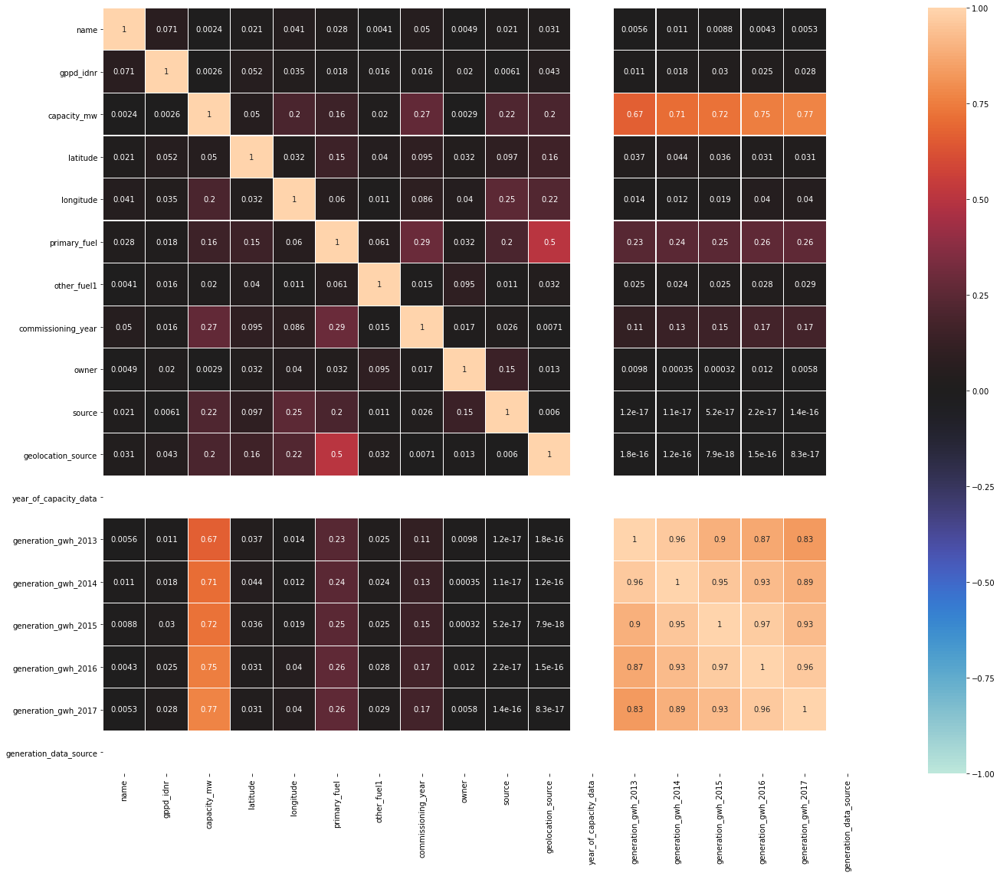

In [106]:
#checking corelation
df_corr = data.corr().abs()

plt.figure(figsize=(22,16))
sns.heatmap(df_corr,vmin=-1,annot=True,
           square=True,center=0,fmt='.2g',linewidths=.1,)
plt.tight_layout()

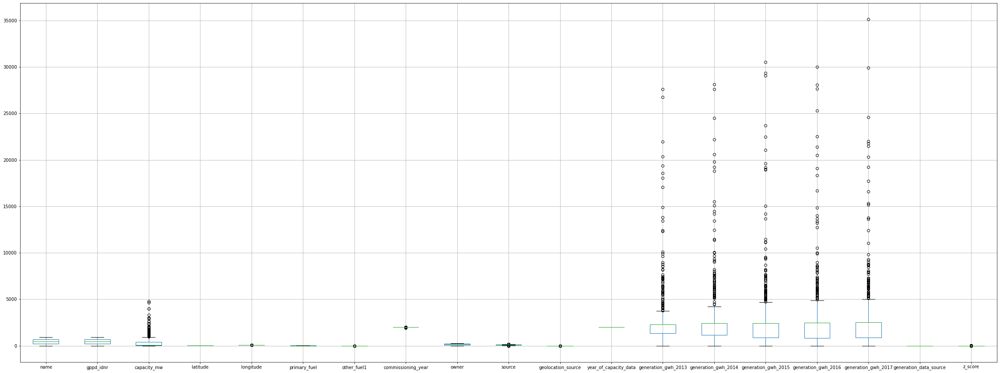

In [178]:
# plotting boxplot to identify outliers
data.boxplot(figsize=[40,30])
plt.subplots_adjust(bottom=0.5)
plt.show()

#box plot for single column to check outliers

<AxesSubplot:xlabel='capacity_mw'>

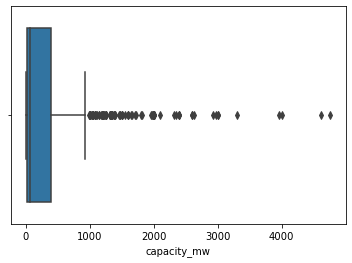

In [117]:

sns.boxplot(data['capacity_mw'])

<AxesSubplot:xlabel='generation_gwh_2013'>

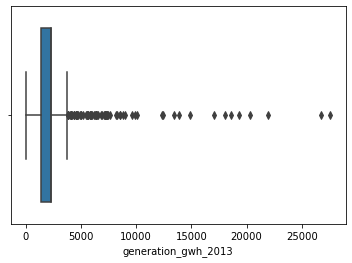

In [183]:
sns.boxplot(data['generation_gwh_2013'])

<AxesSubplot:xlabel='generation_gwh_2014'>

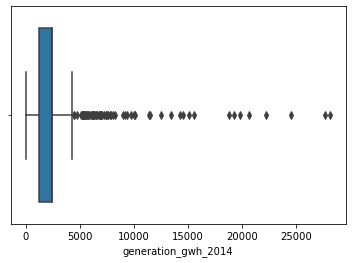

In [184]:
sns.boxplot(data['generation_gwh_2014'])

<AxesSubplot:xlabel='generation_gwh_2015'>

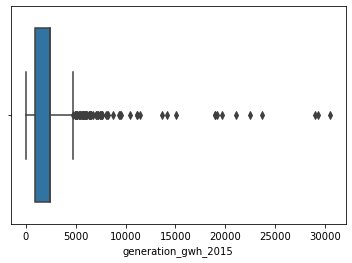

In [185]:
sns.boxplot(data['generation_gwh_2015'])

<AxesSubplot:xlabel='generation_gwh_2016'>

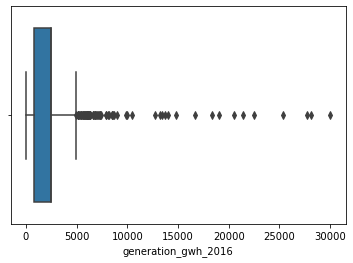

In [186]:
sns.boxplot(data['generation_gwh_2016'])

In [187]:
#z score to identify outlier and removal
data['z_score'] = (data['capacity_mw'] - data['capacity_mw'].mean()) / data['capacity_mw'].std()
data['z_score'] = (data['generation_gwh_2013'] - data['generation_gwh_2013'].mean()) / data['generation_gwh_2013'].std()
data['z_score'] = (data['generation_gwh_2014'] - data['generation_gwh_2014'].mean()) / data['generation_gwh_2014'].std()
data['z_score'] = (data['generation_gwh_2015'] - data['generation_gwh_2015'].mean()) / data['generation_gwh_2015'].std()
data['z_score'] = (data['generation_gwh_2016'] - data['generation_gwh_2016'].mean()) / data['generation_gwh_2016'].std()
data.head()

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source,z_score
0,0.0,0.0,2.5,28.1839,73.2407,0.0,0.0,2011.000000,0.0,0.0,0.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0,-2.053585e-15
1,742.0,790.0,98.0,24.7663,74.6090,1.0,0.0,1996.876894,1.0,1.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0,-2.053585e-15
2,434.0,261.0,39.2,21.9038,69.3732,2.0,0.0,1996.876894,2.0,2.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0,-2.053585e-15
3,9.0,352.0,135.0,23.8712,91.3602,3.0,0.0,2004.000000,2.0,109.0,1.0,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,0.0,-5.446610e-01
4,209.0,887.0,1800.0,21.9603,82.4091,1.0,0.0,2015.000000,2.0,109.0,1.0,2018.0,1668.290000,3035.550000,5916.370000,6243.000000,5385.579736,0.0,1.316228e+00


In [189]:
data[(data['z_score'] < 0) | (data['z_score'] > 2000)]

,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,commissioning_year,owner,source,geolocation_source,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_data_source,z_score
0,0.0,0.0,2.500,28.183900,73.240700,0.0,0.0,2011.000000,0.0,0.0,0.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0,-2.053585e-15
1,742.0,790.0,98.000,24.766300,74.609000,1.0,0.0,1996.876894,1.0,1.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0,-2.053585e-15
2,434.0,261.0,39.200,21.903800,69.373200,2.0,0.0,1996.876894,2.0,2.0,1.0,2018.0,2304.059202,2420.393316,2414.072373,2453.936292,2531.754458,0.0,-2.053585e-15
3,9.0,352.0,135.000,23.871200,91.360200,3.0,0.0,2004.000000,2.0,109.0,1.0,2018.0,631.777928,617.789264,843.747000,886.004428,663.774500,0.0,-5.446610e-01
5,433.0,699.0,250.000,23.768900,68.644700,1.0,0.0,2005.000000,2.0,109.0,1.0,2018.0,821.798000,1153.421000,1208.852000,1175.765000,1147.913000,0.0,-4.440053e-01
6,172.0,121.0,60.000,10.454700,77.007800,4.0,0.0,1970.000000,2.0,109.0,1.0,2018.0,147.568450,157.558250,152.195200,61.421350,89.629600,0.0,-8.311008e-01
7,807.0,89.0,192.000,32.225800,77.207000,4.0,0.0,2010.000000,2.0,109.0,1.0,2018.0,696.738800,674.391100,721.335200,675.724400,679.594950,0.0,-6.177071e-01
8,492.0,644.0,290.000,16.330000,75.886300,4.0,0.0,2004.000000,2.0,109.0,1.0,2018.0,504.813250,480.594950,144.434200,402.029750,439.372100,0.0,-7.127819e-01
9,902.0,147.0,210.000,23.164200,81.637300,1.0,0.0,2008.000000,2.0,109.0,1.0,2018.0,2642.322000,1887.904000,1643.046000,1338.093000,1563.457000,0.0,-3.876165e-01
10,36.0,583.0,1350.000,21.078200,77.900900,1.0,0.0,2014.000000,2.0,109.0,1.0,2018.0,1034.050000,1920.971000,5629.663000,1701.008000,4350.558000,0.0,-2.615488e-01


In [190]:
new_df = data[(data['z_score'] < 2000) & (data['z_score'] > 0)]

In [191]:
# checking for skewed data 
data.skew()

name                       0.000000
gppd_idnr                  0.000000
capacity_mw                3.193257
latitude                  -0.147391
longitude                  1.129836
primary_fuel               0.329823
other_fuel1               13.251308
commissioning_year        -1.383330
owner                     -0.056429
source                    -0.760961
geolocation_source         1.877818
year_of_capacity_data      0.000000
generation_gwh_2013        5.241491
generation_gwh_2014        5.041961
generation_gwh_2015        5.367370
generation_gwh_2016        5.071758
generation_gwh_2017        5.111938
generation_data_source     0.000000
z_score                    5.071758
dtype: float64

In [192]:
# performing operation to remove skewness
from sklearn.preprocessing import power_transform
df_new=power_transform(data)

df_new=pd.DataFrame(df_new,columns=data.columns)

In [193]:
df_new.skew()

name                      -0.288181
gppd_idnr                 -0.288182
capacity_mw                0.020461
latitude                  -0.074872
longitude                  0.002419
primary_fuel              -0.093120
other_fuel1               11.275725
commissioning_year        -0.074158
owner                     -0.303562
source                    -0.756521
geolocation_source        -0.451237
year_of_capacity_data      0.000000
generation_gwh_2013        0.180340
generation_gwh_2014        0.124543
generation_gwh_2015        0.070937
generation_gwh_2016        0.038668
generation_gwh_2017        0.013392
generation_data_source     0.000000
z_score                   -0.058509
dtype: float64

In [194]:
sc=StandardScaler()
x=sc.fit_transform(data)
x

array([[-1.73014431e+00, -1.73014431e+00, -5.49310543e-01, ...,
        -1.55659091e-16,  0.00000000e+00, -4.24902918e-17],
       [ 1.10065410e+00,  1.28377852e+00, -3.84627594e-01, ...,
        -1.55659091e-16,  0.00000000e+00, -4.24902918e-17],
       [-7.43942979e-02, -7.34405248e-01, -4.86024006e-01, ...,
        -1.55659091e-16,  0.00000000e+00, -4.24902918e-17],
       ...,
       [-1.37915583e+00, -1.45545767e+00, -5.09648681e-01, ...,
        -1.55659091e-16,  0.00000000e+00, -4.24902918e-17],
       [-7.15329787e-01, -5.58911007e-01, -4.15667312e-01, ...,
        -1.55659091e-16,  0.00000000e+00, -4.24902918e-17],
       [ 4.86424255e-01, -7.99261816e-01, -5.25168540e-01, ...,
        -1.55659091e-16,  0.00000000e+00, -4.24902918e-17]])

In [195]:
#splitting data
y=data['capacity_mw']

x=data.drop(columns=['capacity_mw'])

In [196]:
#training the data 
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.25)

In [197]:
#lr agoritm
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
lm.fit(x,y)

LinearRegression()

In [198]:
lm.score(x_train,y_train)

0.7194181593296018

In [199]:
lm.score(x_test,y_test)

0.6615080863769509

In [200]:
#checking for mse and r2
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score


In [201]:
print("MSE :", np.sqrt(mean_squared_error(y_test, y_pred)))
print("R^2: ", r2_score(y_test, y_pred))

MSE : 583.7196503591588
R^2:  -0.33908746228023867


In [202]:
#implementing ridge regression
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
ridge = Ridge()

In [203]:
parameters = {"alpha":[90, 80, 70, 74, 83, 92, 91, 85, 100, 60]}
ridge_regression = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=5)
ridge_regression.fit(x, y)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [90, 80, 70, 74, 83, 92, 91, 85, 100, 60]},
             scoring='neg_mean_squared_error')

In [204]:
print(ridge_regression.best_params_)

{'alpha': 60}


In [205]:
print(ridge_regression.best_score_)

-109198.42459140552


In [206]:
#calculating crosss validation score
from sklearn.model_selection import cross_val_score
scr = cross_val_score(lm,x,y,cv=5)
print(scr.mean())

0.6534069335389205


In [207]:
from sklearn.model_selection import cross_val_score
scr = cross_val_score(ridge,x,y,cv=5)
print(scr.mean())

0.6536783291773928


In [208]:
from sklearn.model_selection import cross_val_score
scr = cross_val_score(ridge,x,y,cv=5)
print(scr.mean())

0.6536783291773928


In [209]:
#splitting data
y=data['primary_fuel']

x=data.drop(columns=['primary_fuel'])

In [210]:
#training the data 
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.25)

In [211]:
#lr agoritm
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
lm.fit(x,y)

LinearRegression()

In [212]:
lm.score(x_train,y_train)

0.43529435432132024

In [213]:
lm.score(x_test,y_test)

0.4957281955002063

In [214]:
#saving the model

import pickle

from sklearn import model_selection
filename = 'power.sav'
pickle.dump(data, open(filename, 'wb'))